In [1]:
%load_ext autoreload

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [2]:
%autoreload 2 

In [3]:
%matplotlib inline

In [4]:
%%javascript
IPython.OutputArea.auto_scroll_threshold = 9999;

<IPython.core.display.Javascript object>

In [4]:
import pickle
import matplotlib.pyplot as plt
from scipy.stats.stats import pearsonr as PearsonR
import sys
import h5py
from matplotlib.mlab import bivariate_normal

In [5]:
sys.path.append("../")

In [6]:
import plot_gal_prop as pg
import extract_catalog as ec
import get_gal_centroids as get_gal

In [7]:
f = h5py.File("../../data/Illustris-1_fof_subhalo_myCompleteHaloCatalog_00135.hdf5")

In [8]:
clstDF_list = map(lambda i: ec.extract_clst(f, i), range(129))

In [10]:
clstDF_list[0].keys()

Index([u'SubhaloGrNr', u'SubhaloLenType0', u'SubhaloLenType1', u'SubhaloLenType2', u'SubhaloLenType3', u'SubhaloLenType4', u'SubhaloLenType5', u'SubhaloMass', u'SubhaloPos0', u'SubhaloPos1', u'SubhaloPos2', u'U_band', u'B_band', u'V_band', u'K_band', u'g_band', u'r_band', u'i_band', u'z_band'], dtype='object')

In [12]:
suffix = "_wwt"

In [13]:
offset_list = np.array(pickle.load(open(
    'offset_list_129' + suffix + '.pkl')))
relaxedness_list = np.array(pickle.load(
    open('relaxedness_129' + suffix + '.pkl')))
fhat_list = pickle.load(open('fhat_129' + suffix + '.pkl'))

In [14]:
fhat_list[0].keys()

['gridtype',
 'bandwidth_matrix_H',
 'peaks_ycoords',
 'peaks_xcoords',
 'gridded',
 'weight_w',
 'binned',
 'peaks_colIx',
 'names',
 'estimate',
 'data_x',
 'eval_points',
 'peaks_rowIx',
 'peaks_dens']

In [15]:
eval_points1 = fhat_list[0]["eval_points"][0]
eval_points2 = fhat_list[0]["eval_points"][1]

In [16]:
R200C = f["Group"]["Group_R_Crit200"][:129]

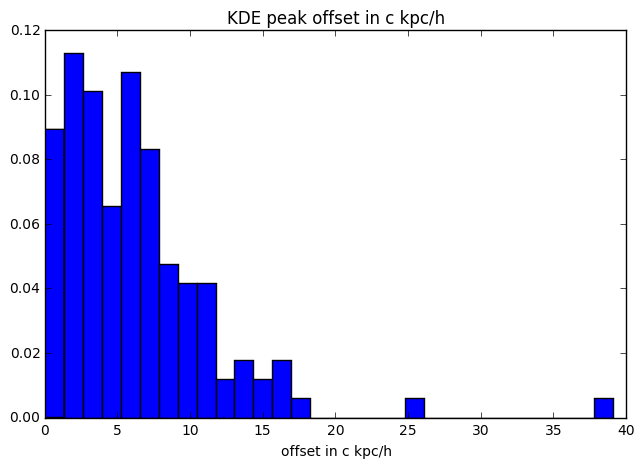

In [34]:
_, _, _ = plt.hist(offset_list[:, 0], normed=True, 
                   bins=30)
plt.title('KDE peak offset in c kpc/h')
plt.xlabel('offset in c kpc/h')

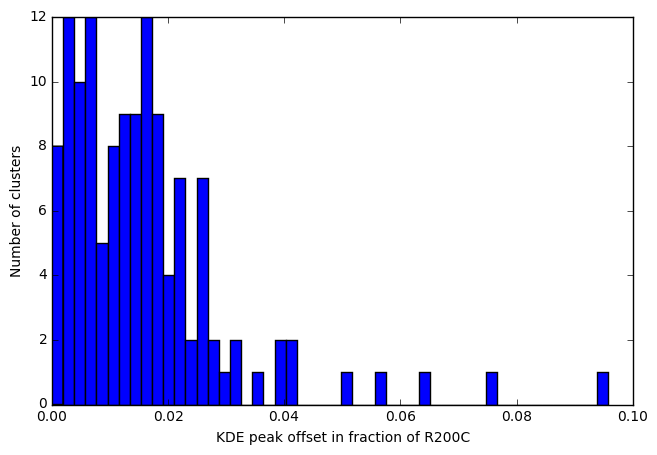

In [18]:
_, _, _ = plt.hist(offset_list[:, 1],
                   bins=50)
plt.xlabel('KDE peak offset in fraction of R200C')
plt.ylabel('Number of clusters')
plt.savefig('../plots/KDE_peak_mostBound_offset_full_range.png', 
            bbox_inches='tight', dpi=150)

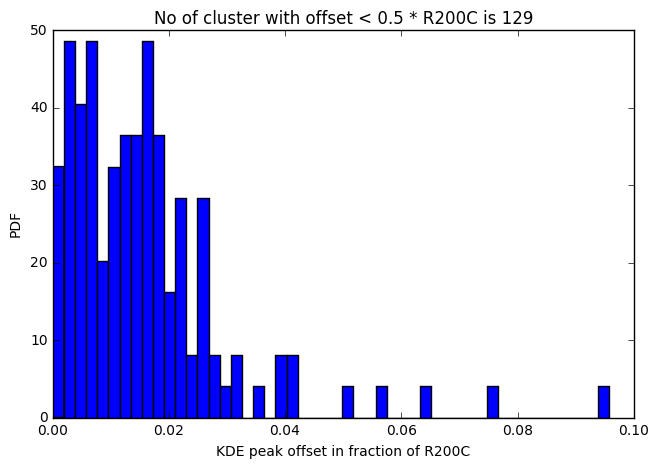

In [36]:
mask = offset_list[:, 1] < 0.5
_, _, _ = plt.hist(offset_list[:, 1], normed=True,
                   bins=50)
plt.title("No of cluster with offset < 0.5 * R200C is {0}".format(np.sum(mask)))
plt.xlabel('KDE peak offset in fraction of R200C')
plt.ylabel('PDF')
plt.savefig('../plots/KDE_peak_mostBound_offset_zoomed.png', 
            bbox_inches='tight', dpi=150)

In [20]:
np.sum(mask) / 129.

1.0

Look at the correlation of the relaxedness and the offset in R200C

In [25]:
pearsonr, pvalue = PearsonR(relaxedness_list, offset_list[:, 1])

In [26]:
print "pearson R coefficient is {0}".format(pearsonr)
print "p value is ... {0}".format(pvalue)

pearson R coefficient is 0.341108632625
p value is ... 7.6260601933e-05


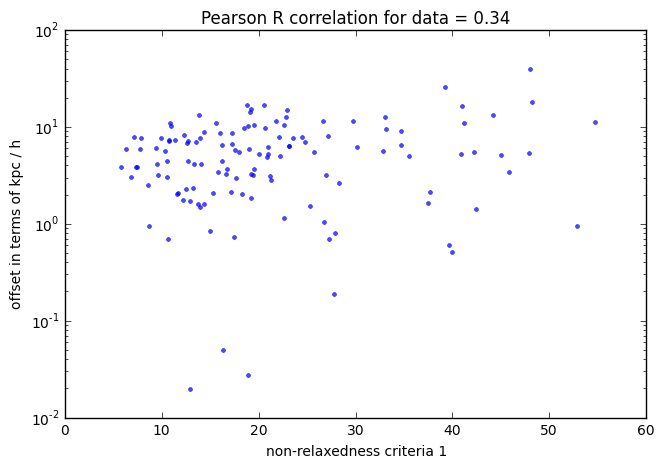

In [24]:
#plt.semilogy(relaxedness_list, offset_list[:, 0], 'r.', alpha=0.7)
plt.semilogy(relaxedness_list, offset_list[:, 0], 'b.', alpha=0.7)
plt.xlabel("non-relaxedness criteria 1")
plt.ylabel("offset in terms of kpc / h ")
plt.title("Pearson R correlation for data " + 
          "= {0:.2f}".format(pearsonr))
plt.savefig("../plots/relaxednessVSOffsetInR200C.png", 
            bbox_inches="tight", dpi=200)

not very correlated ... 

# Look at the KDE maps from ks_KDE.r

In [27]:
fhat_dict = fhat_list

In [28]:
fhat_dict[0].keys()

['gridtype',
 'bandwidth_matrix_H',
 'peaks_ycoords',
 'peaks_xcoords',
 'gridded',
 'weight_w',
 'binned',
 'peaks_colIx',
 'names',
 'estimate',
 'data_x',
 'eval_points',
 'peaks_rowIx',
 'peaks_dens']

In [29]:
fhat = fhat_dict[0]

In [31]:
_ = map(get_gal.get_density_weights, fhat_dict) 

width: 415.23314256, height: 344.98099536, angle -80.4933523191


/Users/karenyng/Documents/Illustris_analysis/IEnv/lib/python2.7/site-packages/matplotlib/patches.py:102: UserWarning: Setting the 'color' property will overridethe edgecolor or facecolor properties. 
  warnings.warn("Setting the 'color' property will override"


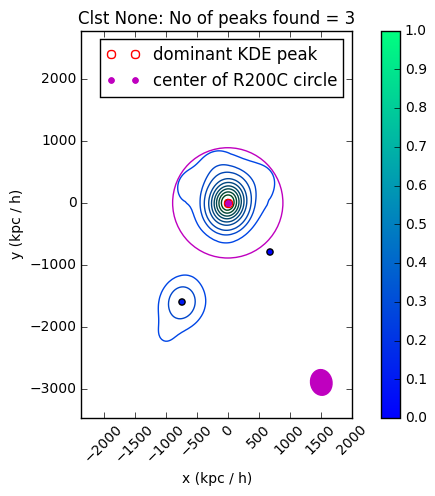

In [32]:
#plt.plot(fhat_dict[0]['domPeak'][0],
#         fhat_dict[0]['domPeak'][1],
#         'rx', label='KDE density peak')
#plt.plot(0, 0, 'ko', fillstyle='none',
#         label='most bound particle')
#plt.legend(loc='best')

pg.plot_KDE_peaks(fhat_dict[0], allPeaks=True, 
                  R200C=R200C[0], showData=True)

width: 415.23314256, height: 344.98099536, angle -80.4933523191


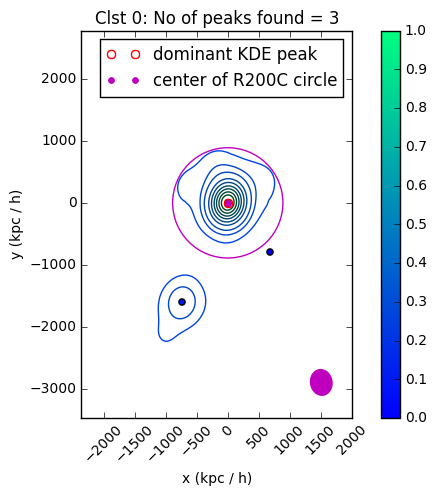

width: 443.90535934, height: 382.910537097, angle 24.915779094


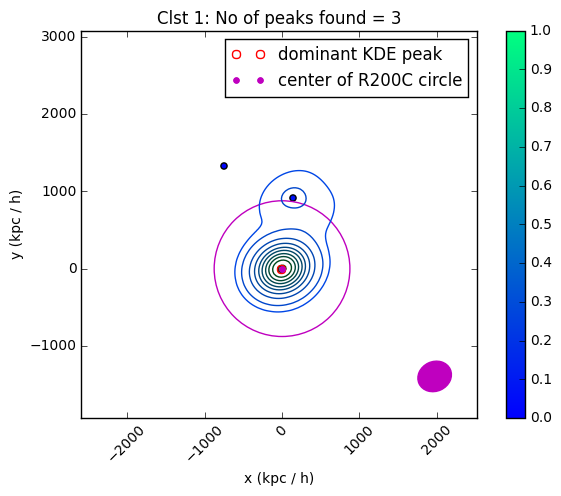

width: 558.584965996, height: 306.668091991, angle -17.3657370676


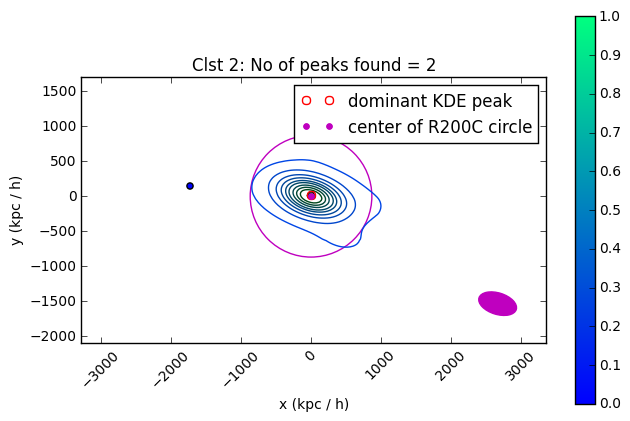

width: 604.439351061, height: 413.426490917, angle -36.4593152686


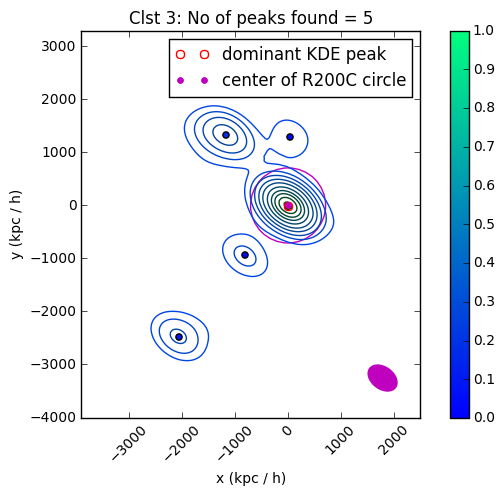

width: 401.146308713, height: 291.393182041, angle -5.06947042427


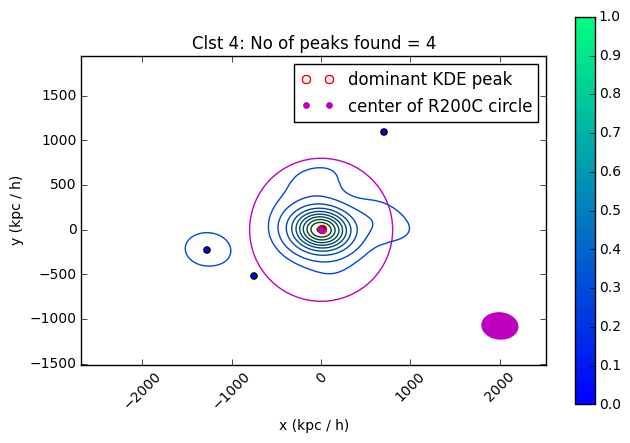

width: 659.77847806, height: 393.0043674, angle -22.6046016821


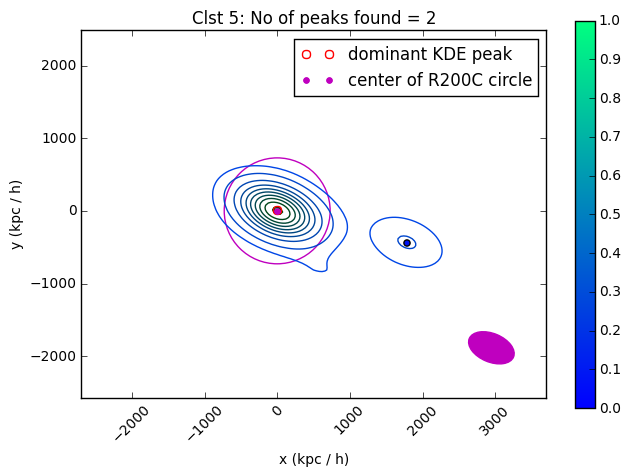

width: 435.481912876, height: 352.023647539, angle -10.7434239191


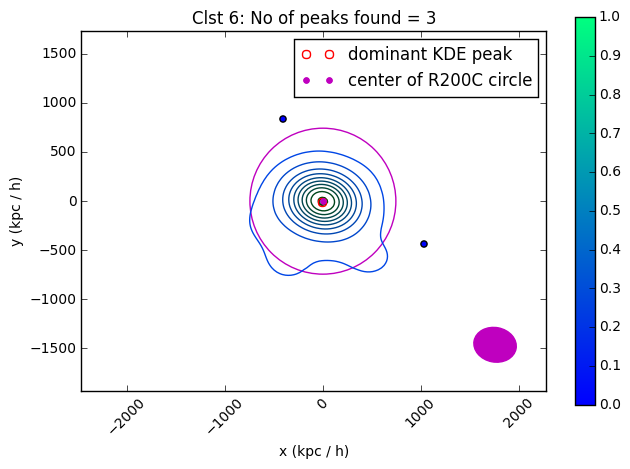

width: 1079.68466673, height: 247.187952029, angle 0.0884240889073


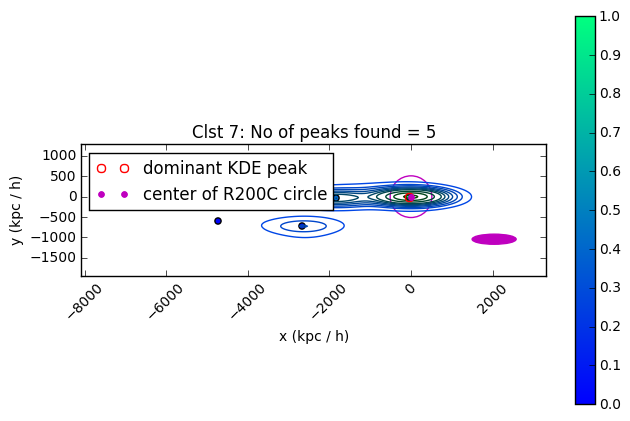

width: 472.920056088, height: 466.979480721, angle -76.0314229098


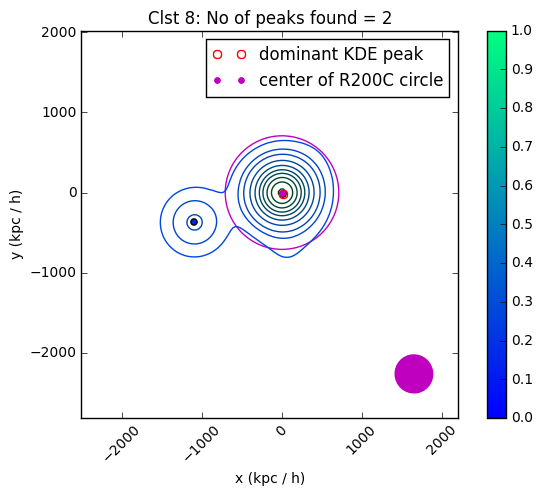

width: 474.923341141, height: 321.813507442, angle -92.9058577213


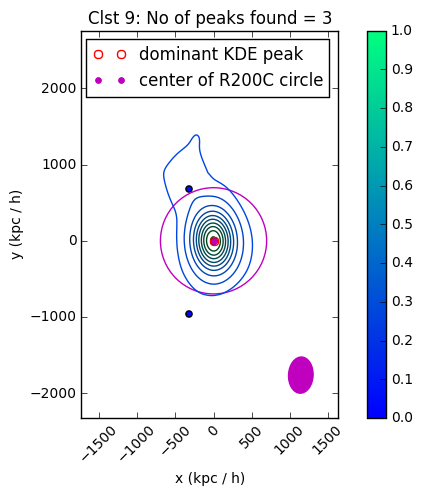

width: 589.449104652, height: 355.013328591, angle -6.56023885074


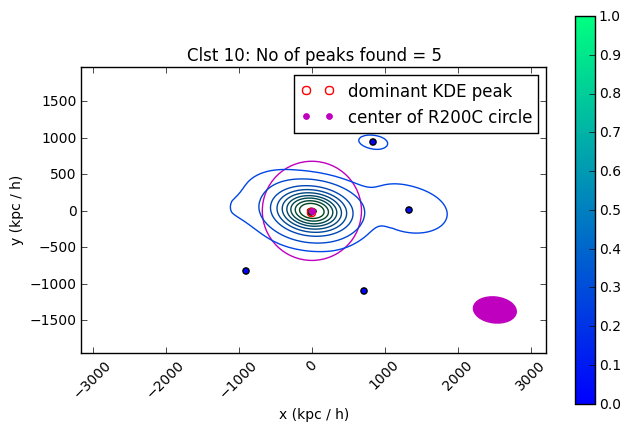

width: 557.251012676, height: 336.165421437, angle -79.7706567586


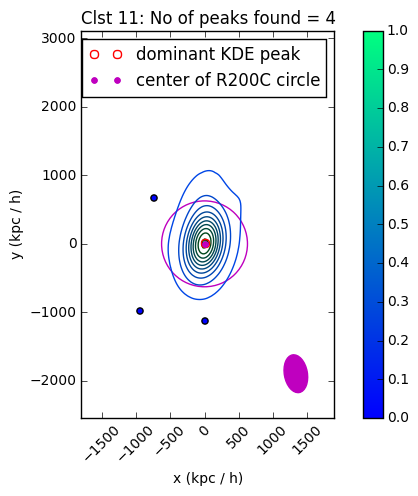

width: 482.718613664, height: 329.118689093, angle -81.498164348


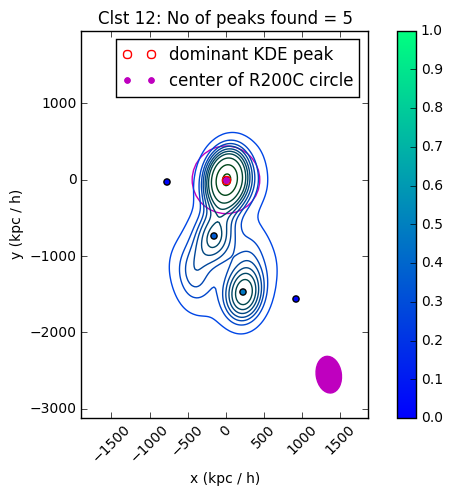

width: 417.10755797, height: 387.197547669, angle -71.1288181027


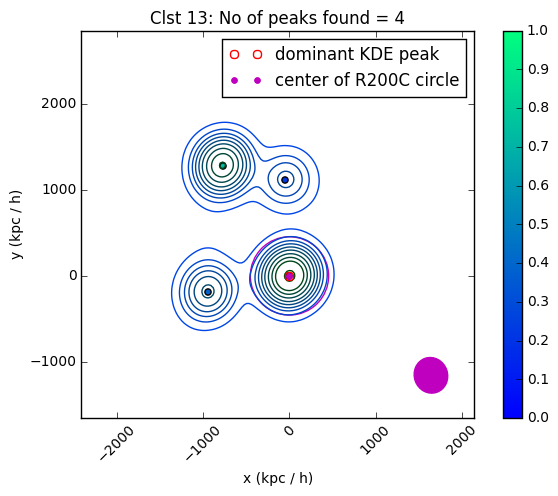

width: 456.474798917, height: 276.284445517, angle -72.3178556181


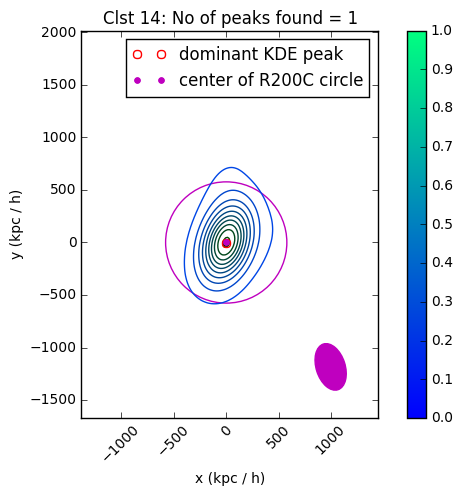

width: 521.672741196, height: 329.713727389, angle -55.388868613


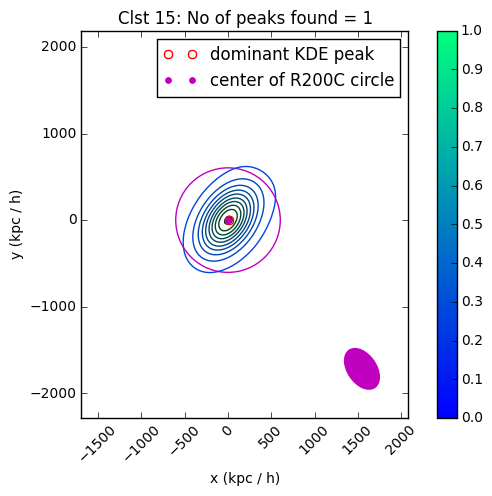

width: 509.248308199, height: 248.891947529, angle -111.501980523


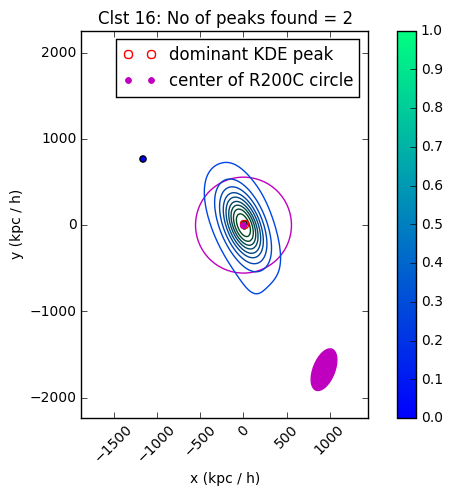

width: 427.855974152, height: 269.449257284, angle 27.6067656641


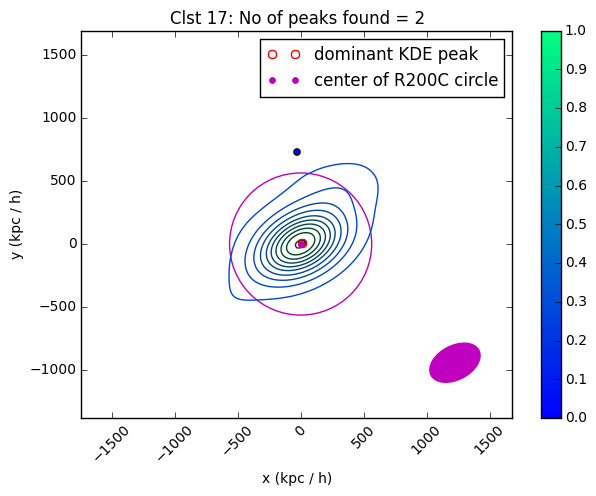

width: 545.203992947, height: 393.545258787, angle 44.4366000958


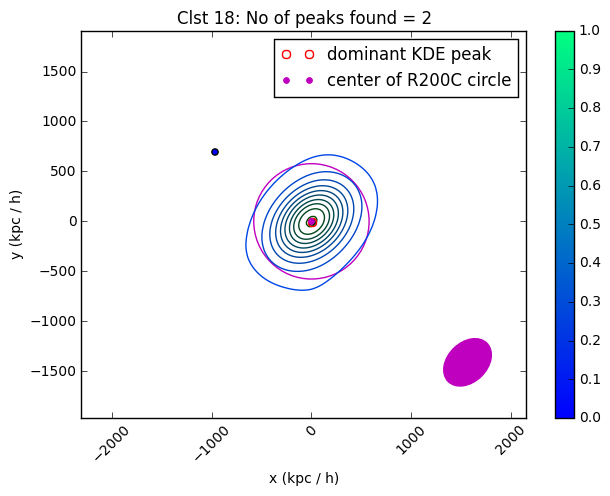

width: 772.748169199, height: 253.915294516, angle -62.1413087019


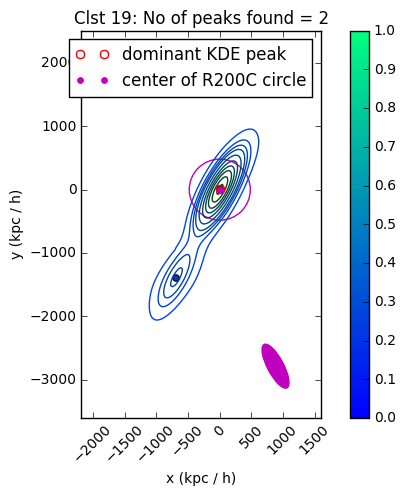

width: 948.934787993, height: 304.444684436, angle -18.7186616624


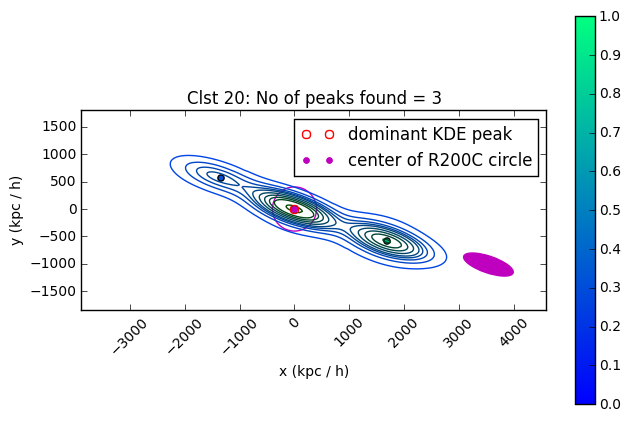

width: 463.045314419, height: 318.989591341, angle -74.0493459269


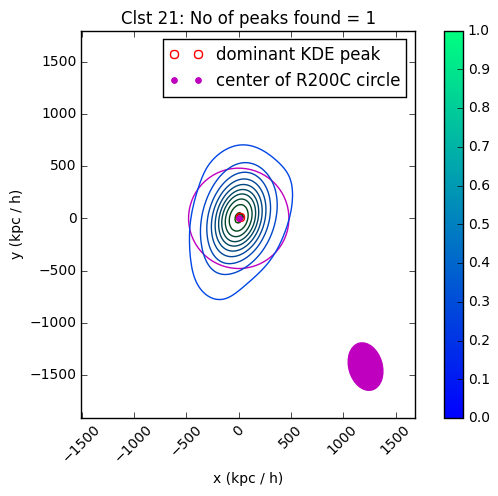

width: 289.07711766, height: 206.926742349, angle -126.089507264


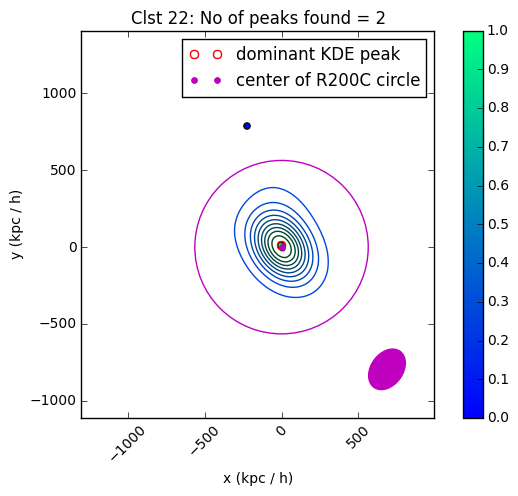

width: 720.226103643, height: 260.945231947, angle -82.9549450681


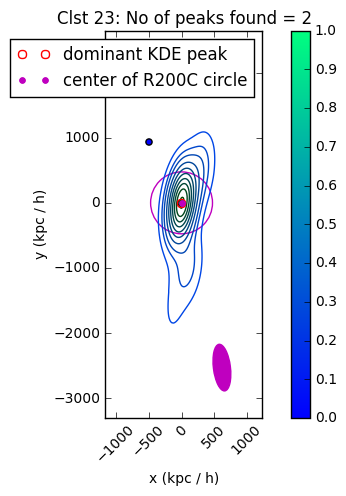

width: 599.866442042, height: 245.910647294, angle -35.7116945467


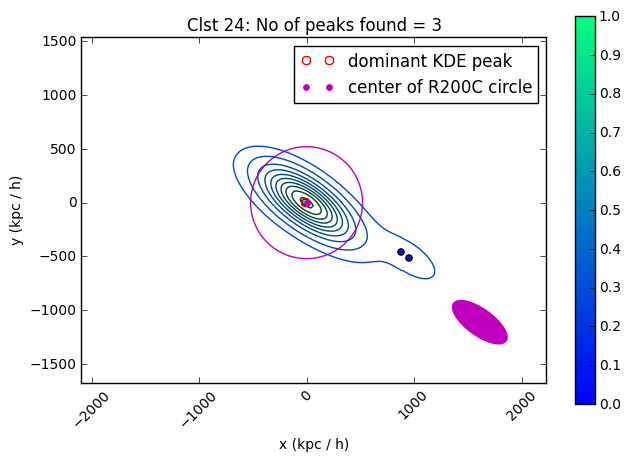

width: 333.369486804, height: 290.051000665, angle -89.6666638272


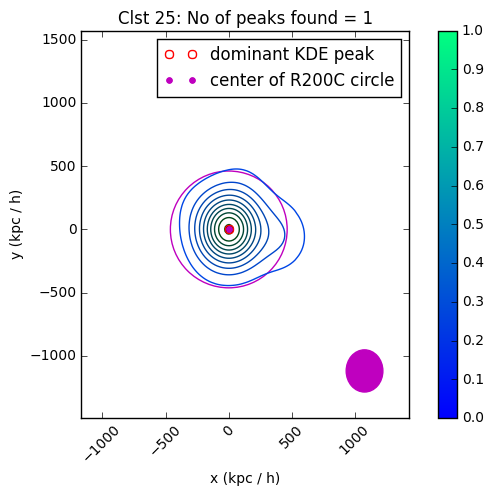

width: 440.493226447, height: 216.29140959, angle -99.2759877354


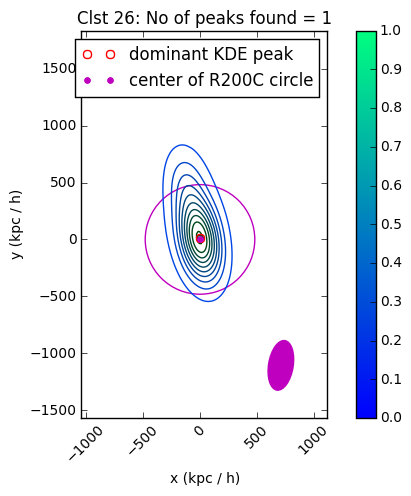

width: 496.026189226, height: 282.586101532, angle -81.0740231976


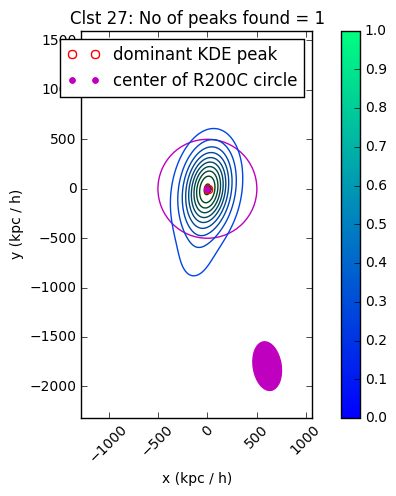

width: 340.798717924, height: 298.611633792, angle -100.319911206


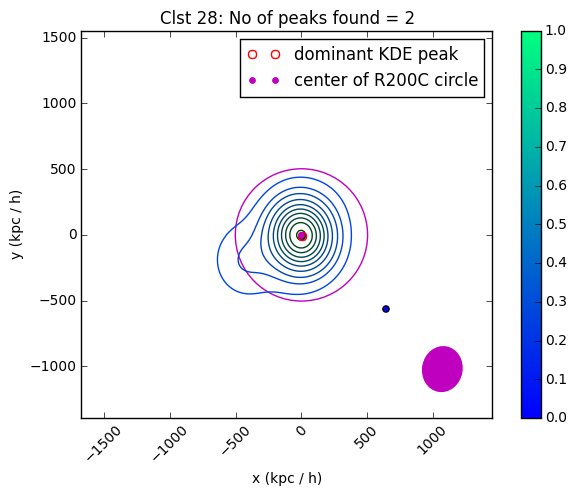

width: 414.835127138, height: 258.453588267, angle -134.390484984


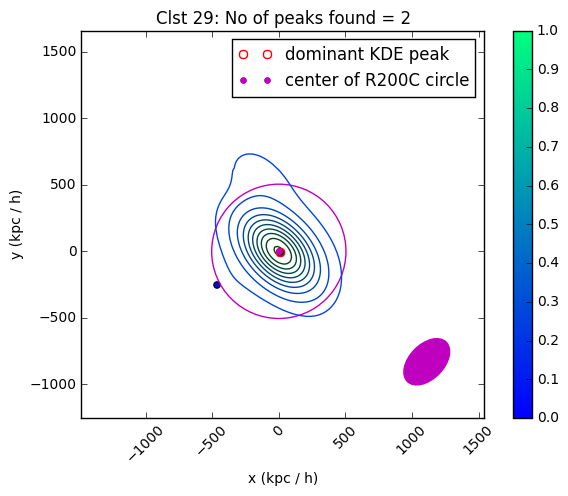

width: 481.85031721, height: 317.76797842, angle -21.1903639916


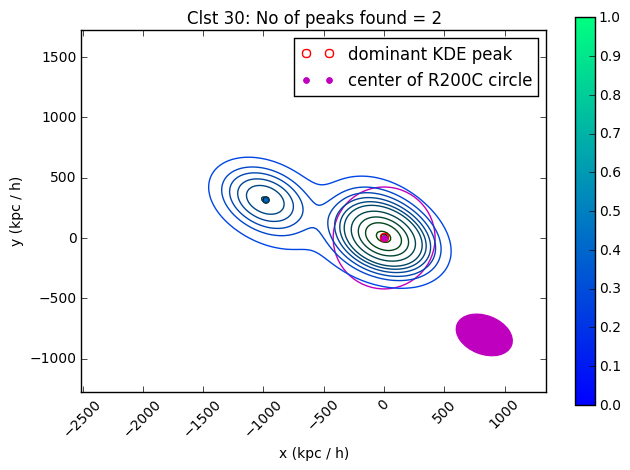

width: 465.475388264, height: 311.646148556, angle -13.903771006


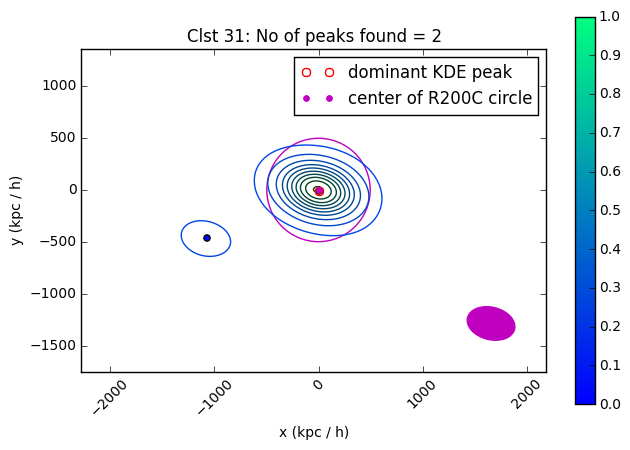

width: 471.688357028, height: 347.810555123, angle -111.550444145


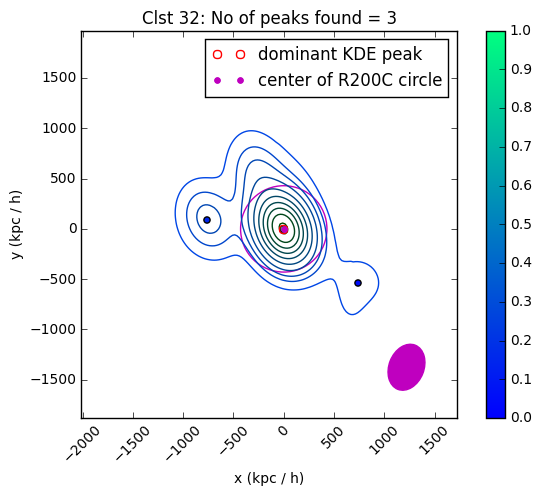

width: 364.884204469, height: 210.586705575, angle 3.26225184439


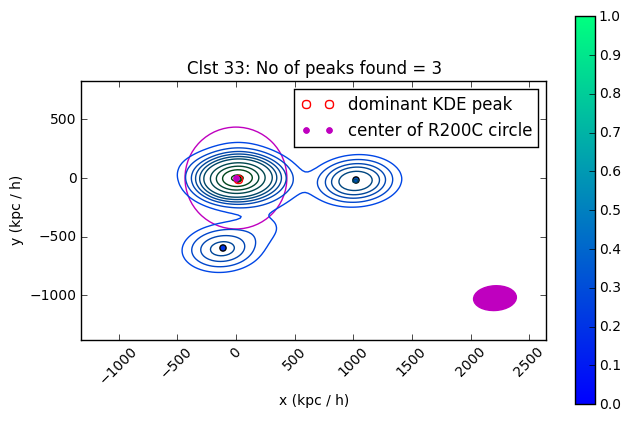

width: 480.398882131, height: 296.810191342, angle -108.72226342


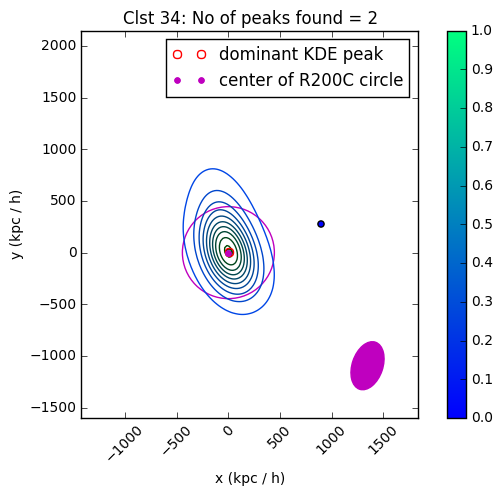

width: 330.356745083, height: 248.157406716, angle -56.2544623011


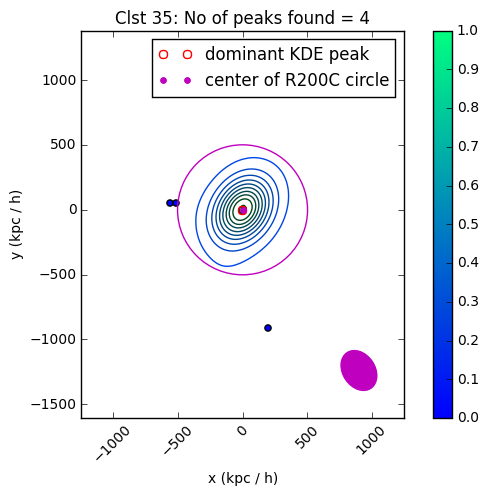

width: 372.967143029, height: 276.878472871, angle 34.9488242987


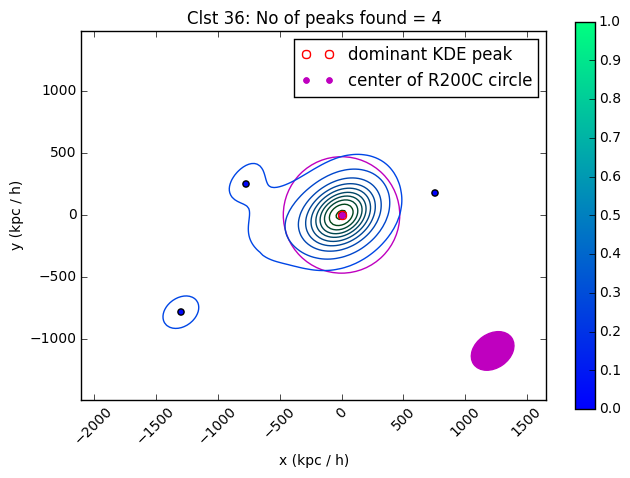

width: 508.400754832, height: 271.476361589, angle -59.5609295782


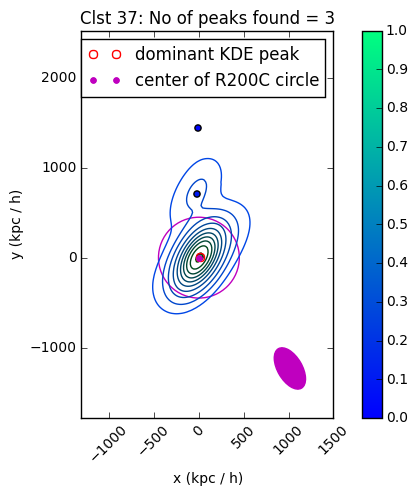

width: 416.08735926, height: 233.723609001, angle -79.933484069


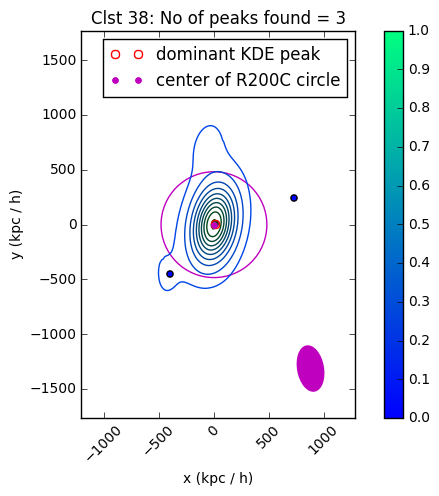

width: 422.479385183, height: 231.941330075, angle -127.390243207


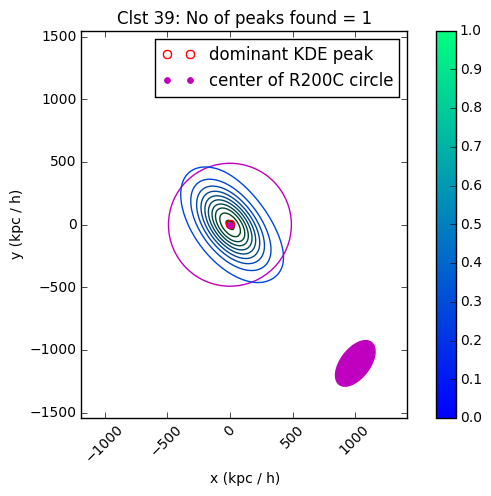

width: 387.480458852, height: 236.114929874, angle -0.672454853116


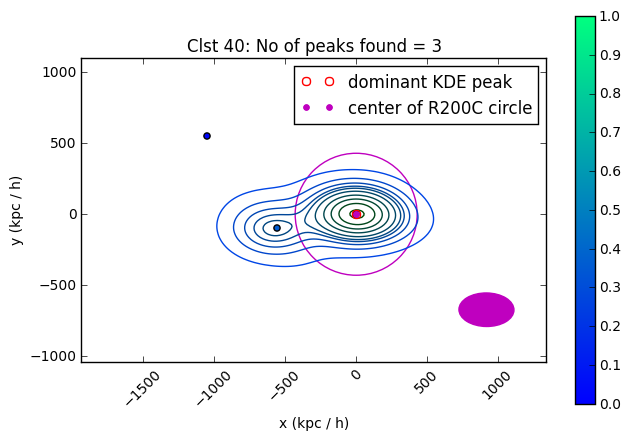

width: 631.105565354, height: 319.41079924, angle -63.7474595041


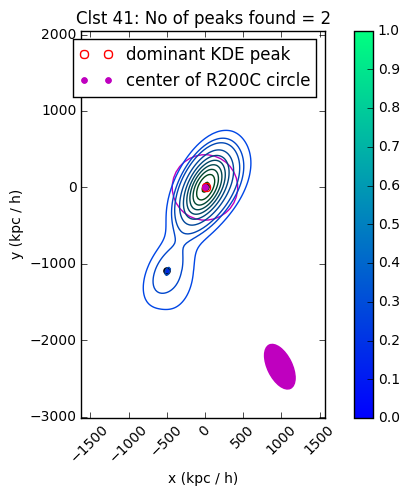

width: 325.054654781, height: 284.779649476, angle -107.546753169


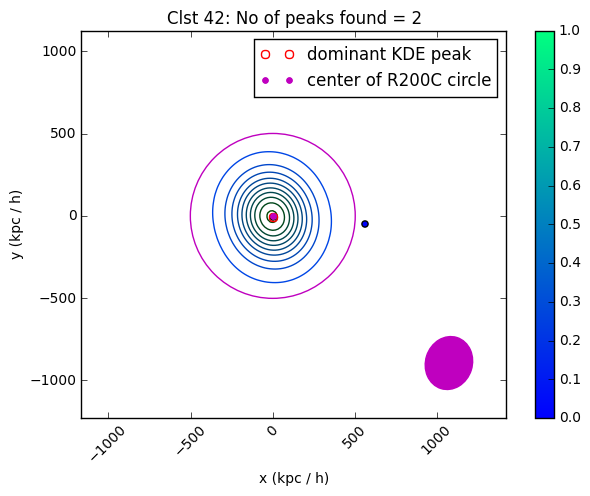

width: 765.006754097, height: 212.362010538, angle -130.138230182


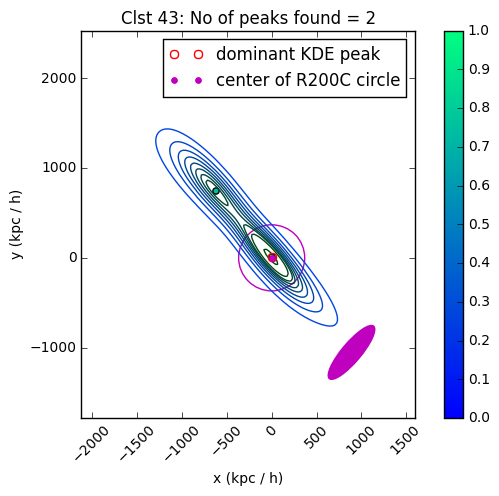

width: 519.425419236, height: 267.299876272, angle -94.4507038655


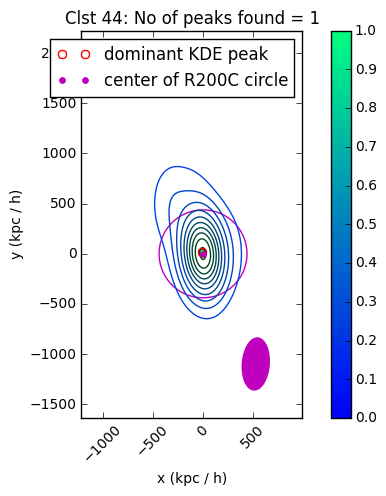

width: 371.446549647, height: 269.133700724, angle -65.6266835666


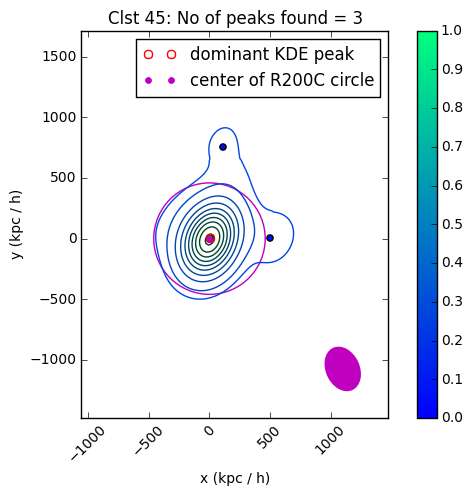

width: 477.924962784, height: 380.119676817, angle -2.98156184796


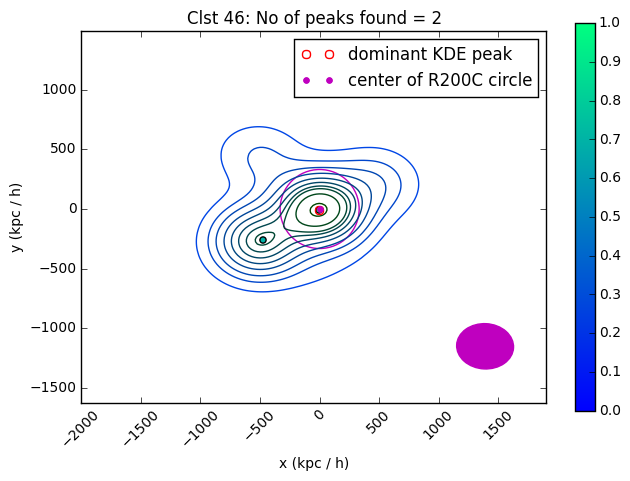

width: 585.393339654, height: 372.969528627, angle -84.9797145831


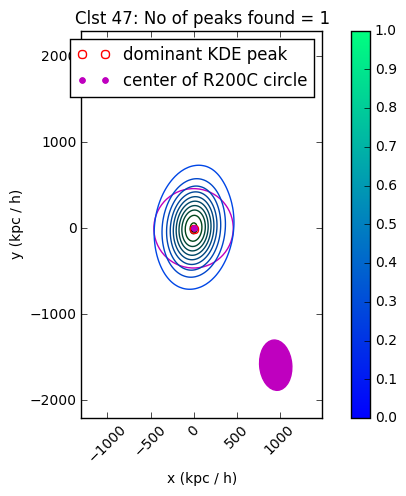

width: 508.374810869, height: 266.24512773, angle 39.4193846174


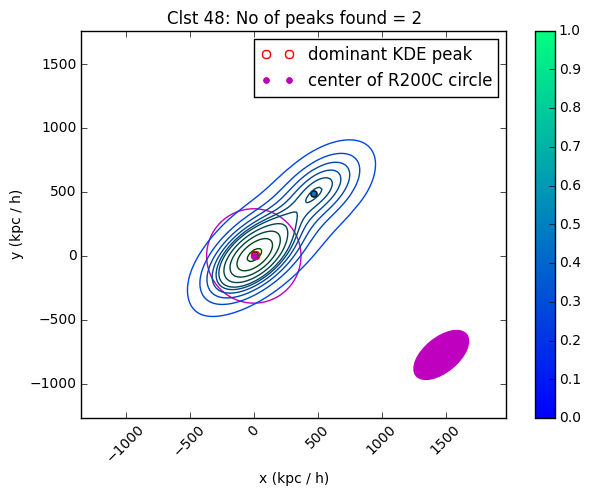

width: 309.480608343, height: 222.282913571, angle -52.6920656135


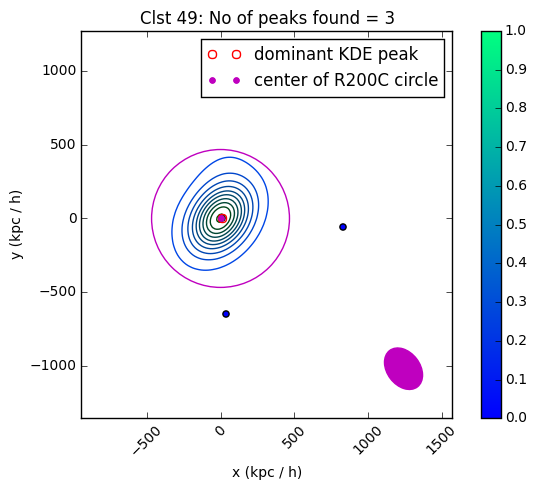

width: 364.666529134, height: 273.200985458, angle -30.6473868794


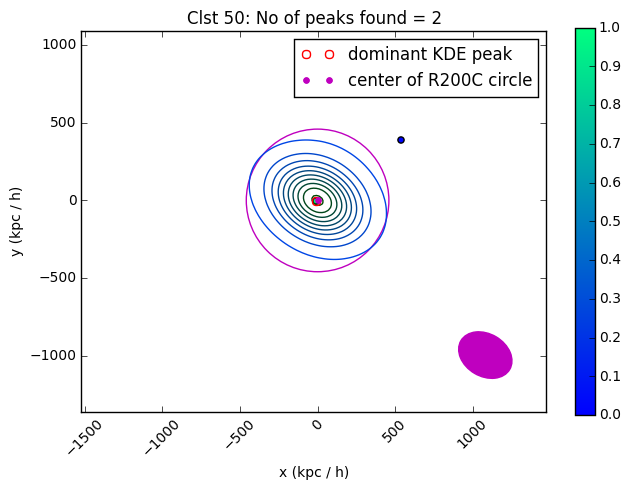

width: 578.205837503, height: 209.529854084, angle -61.5279106988


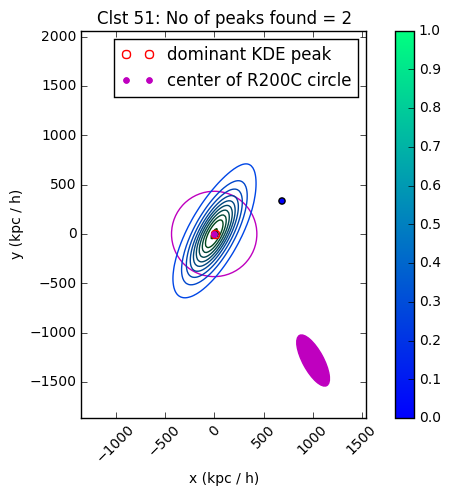

width: 386.591120643, height: 296.129951365, angle -130.832465033


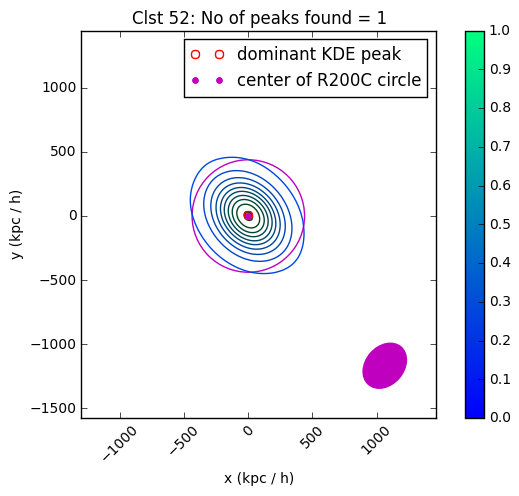

width: 443.880158239, height: 320.138987735, angle -72.56619901


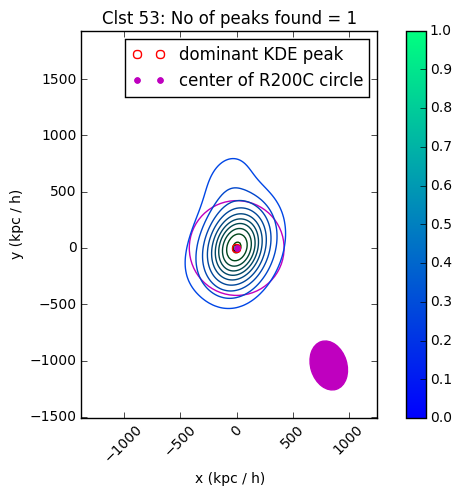

width: 344.386822938, height: 313.57018958, angle 20.4304265145


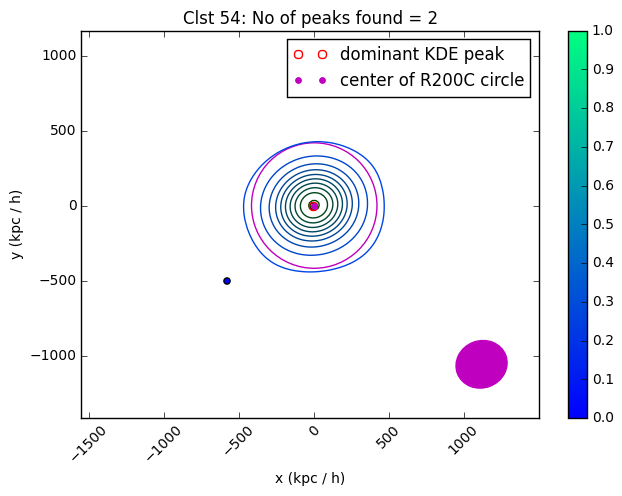

width: 506.742448897, height: 330.474858973, angle -125.17812584


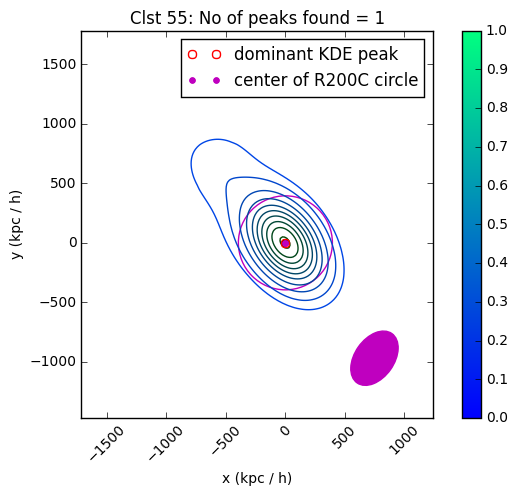

width: 409.878401581, height: 242.111529179, angle -97.8241495491


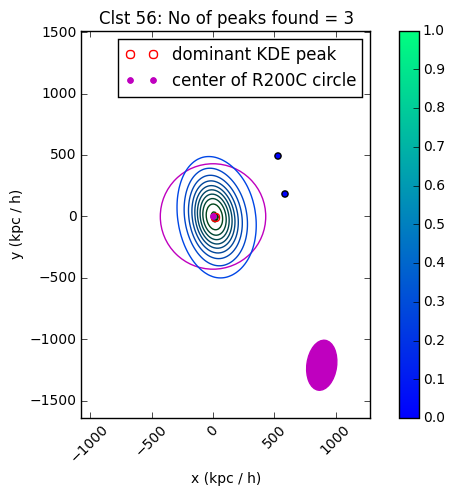

width: 548.887830398, height: 308.678432111, angle -40.4586438124


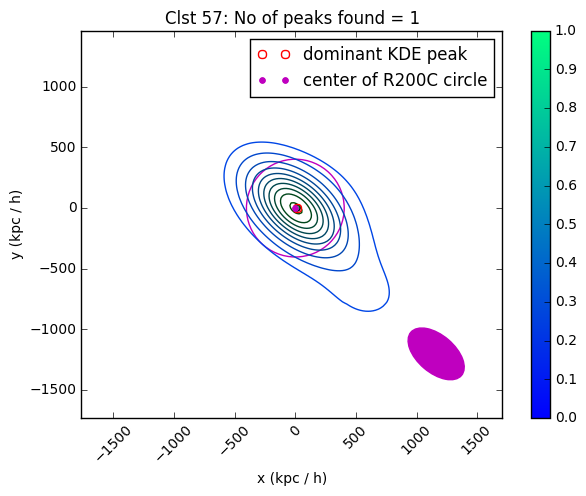

width: 384.811658123, height: 228.958861212, angle -93.1003726025


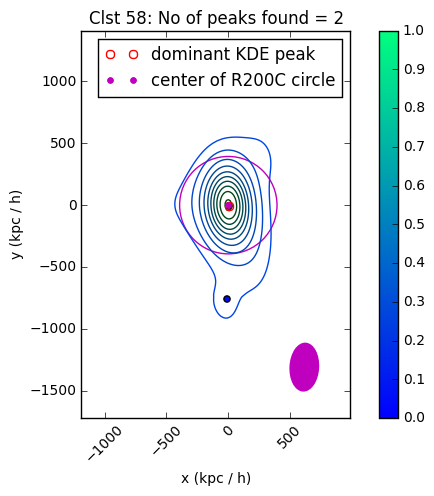

width: 425.759917467, height: 305.209884378, angle -64.6683848755


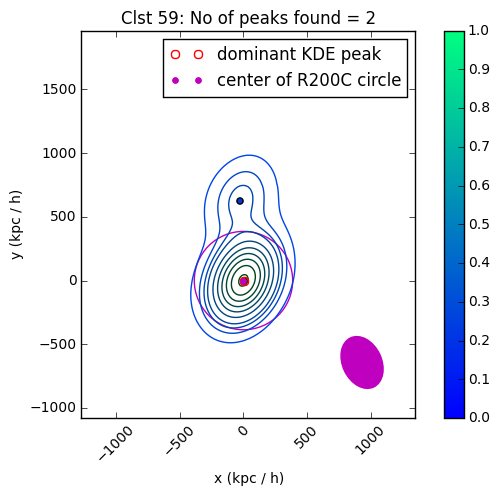

width: 398.998799592, height: 189.137843907, angle 12.315270236


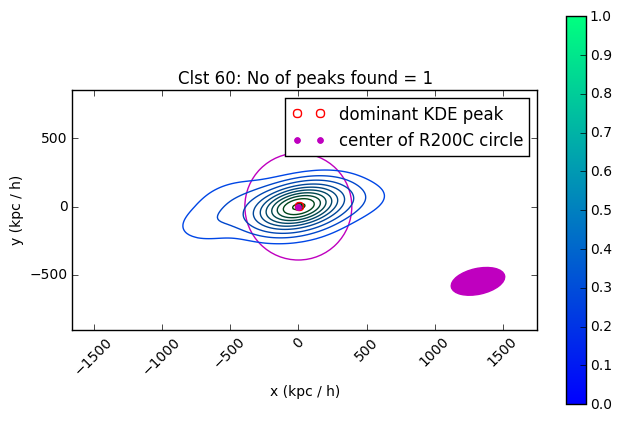

width: 382.353741452, height: 286.262686091, angle -33.7236569186


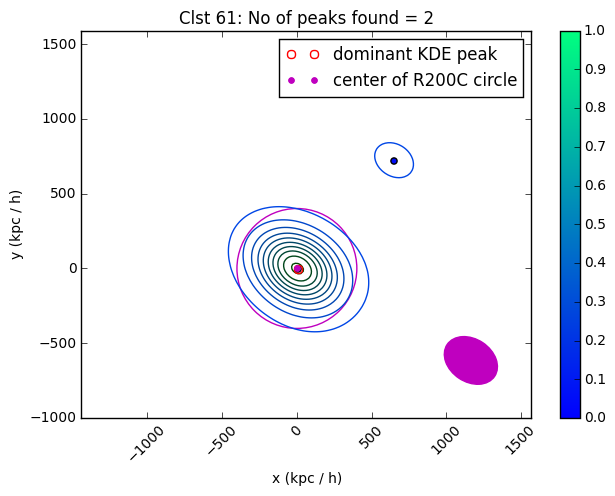

width: 356.101409839, height: 244.14453603, angle -79.4933298874


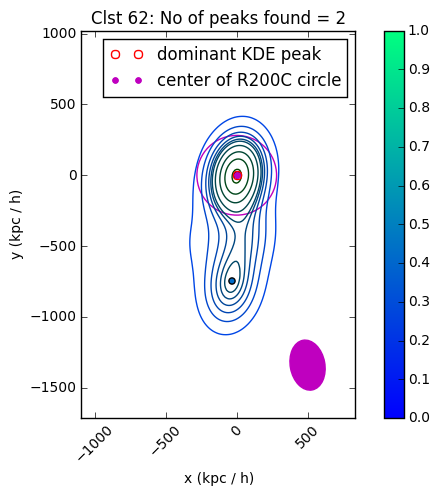

width: 476.883557278, height: 326.879287453, angle -5.13452151599


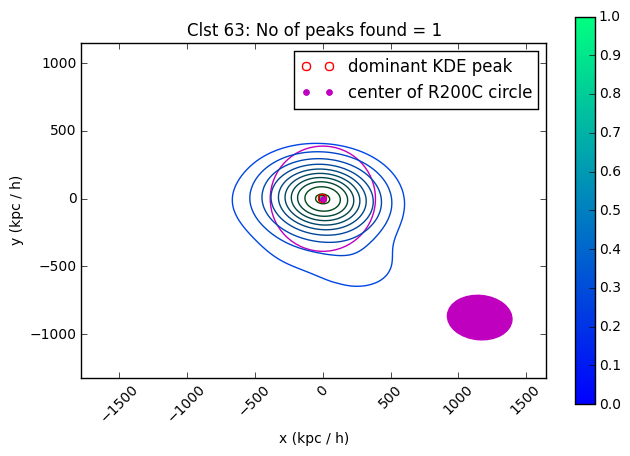

width: 414.553844969, height: 257.067643997, angle -97.4594725629


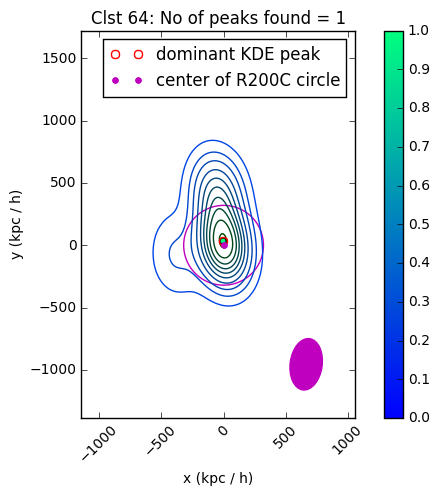

width: 564.975200612, height: 363.335018763, angle 12.7308772986


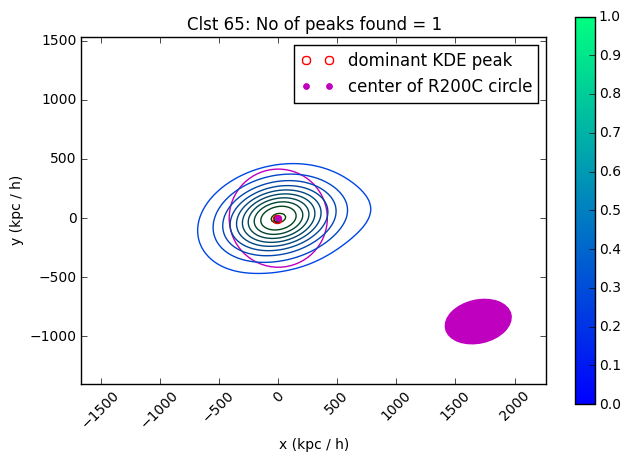

width: 439.203063716, height: 233.54502394, angle -61.5578332719


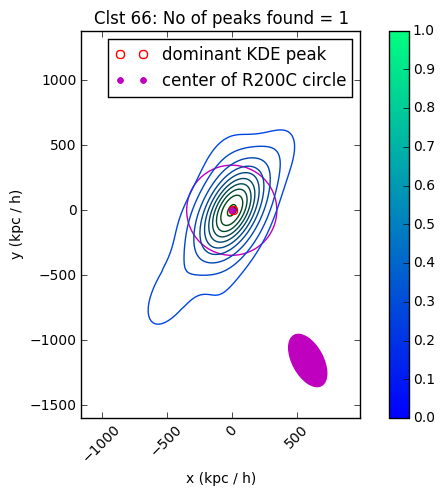

width: 321.302881647, height: 196.408616765, angle -24.8143864524


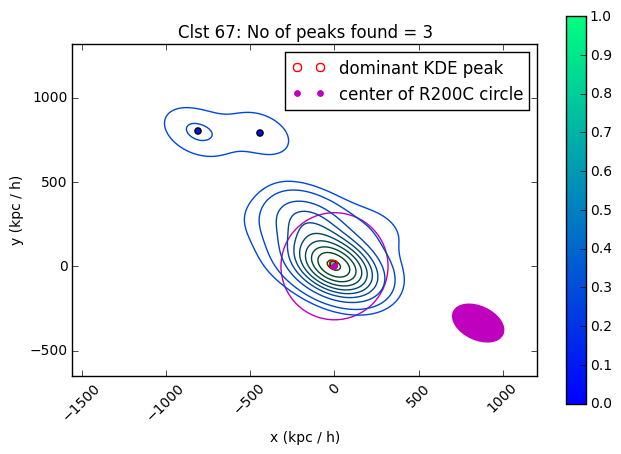

width: 369.403487646, height: 295.461156695, angle 10.5197308218


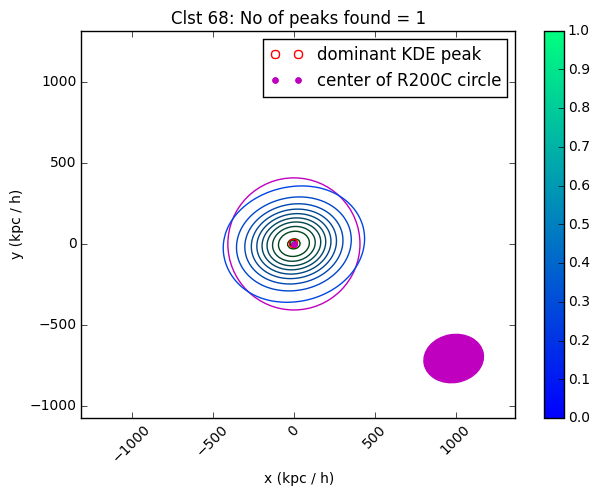

width: 586.047979729, height: 326.346565828, angle -27.0566232401


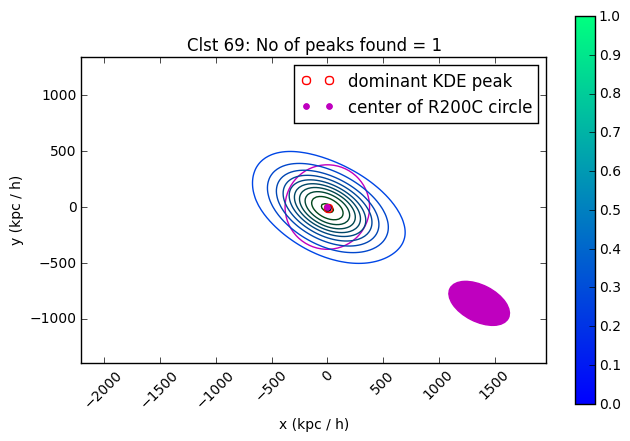

width: 643.038982108, height: 260.039292595, angle -3.69948970232


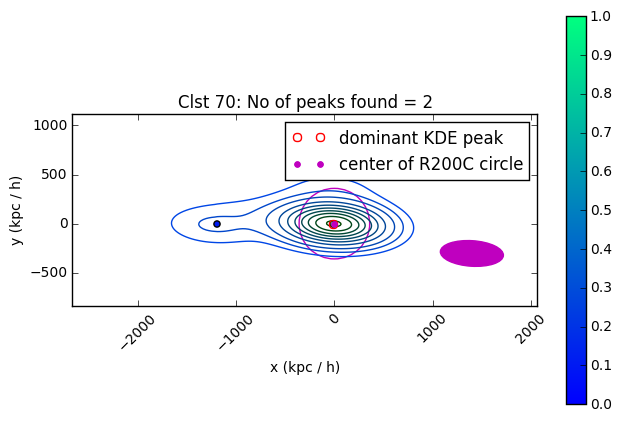

width: 377.189059738, height: 241.555832074, angle -76.9612911866


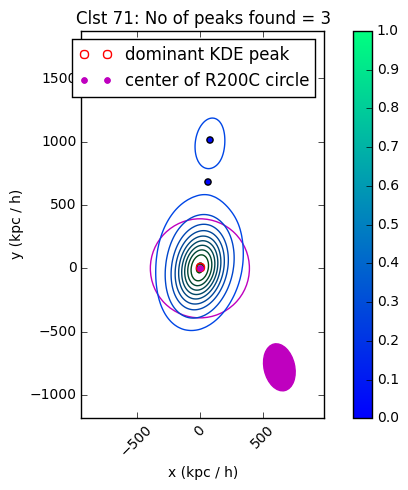

width: 445.257928933, height: 311.664391309, angle 37.2136624068


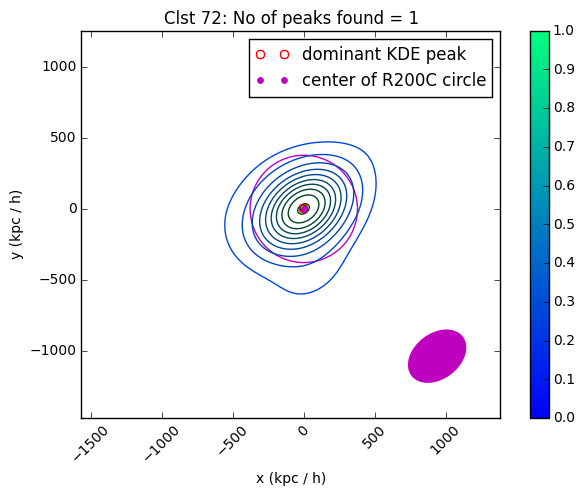

width: 544.388667595, height: 249.724010599, angle 37.4149762348


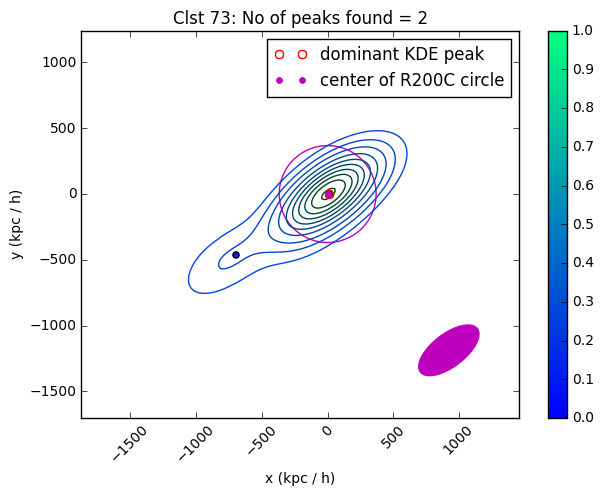

width: 398.844112181, height: 236.624144967, angle -72.0153263903


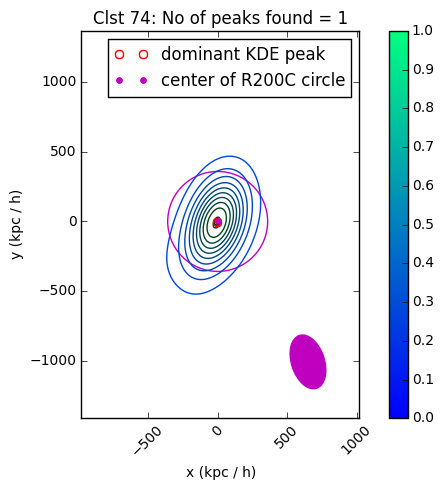

width: 504.659385586, height: 209.81454352, angle -7.25322300036


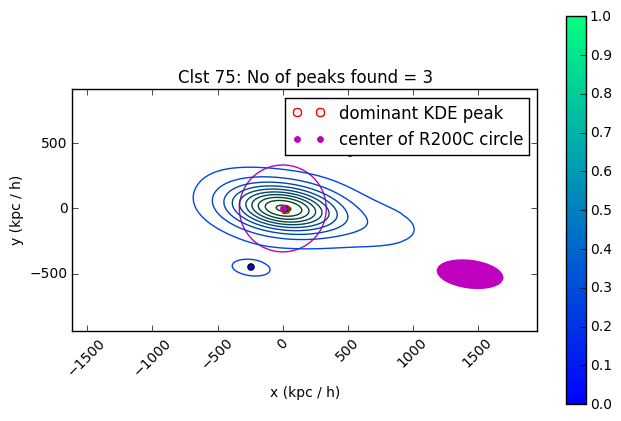

width: 455.261266699, height: 242.878153053, angle -62.3774698982


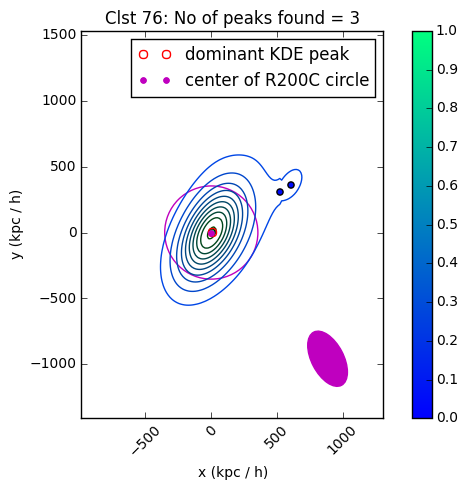

width: 408.109892243, height: 264.362221778, angle -134.791673409


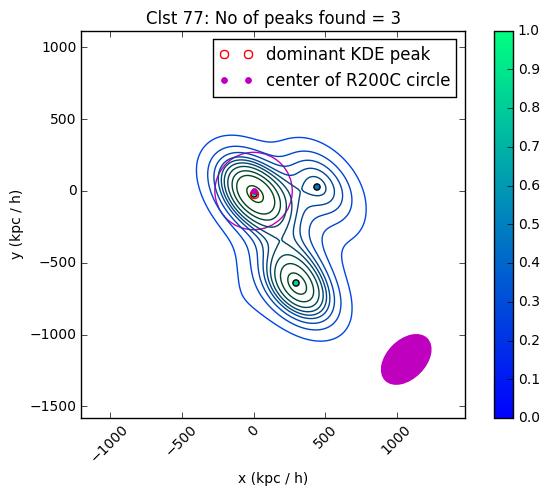

width: 505.417640301, height: 230.504913761, angle -114.142747186


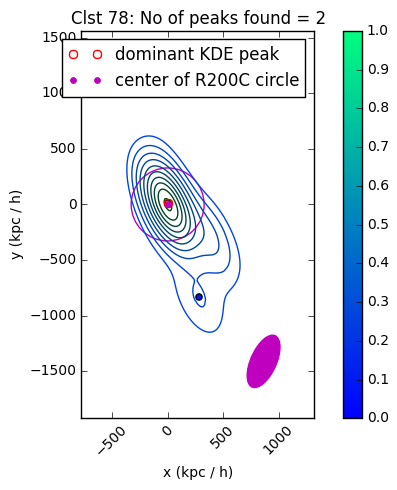

width: 563.810474251, height: 188.392088557, angle 21.014125805


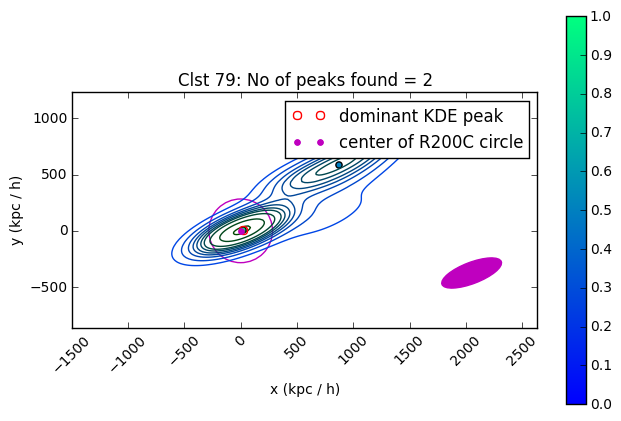

width: 470.192477572, height: 288.093114468, angle -23.5828454806


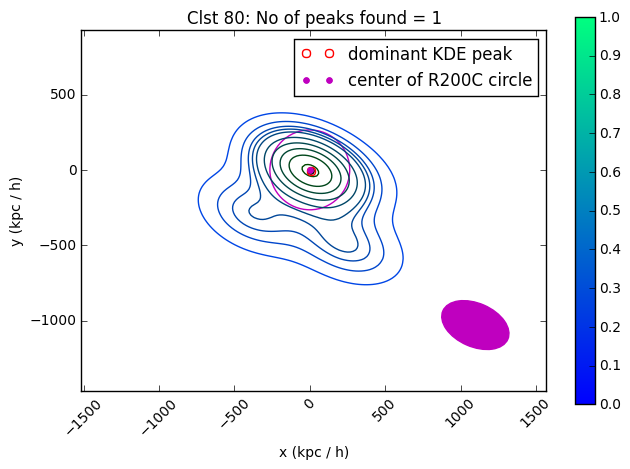

width: 446.121660689, height: 241.023244286, angle 2.03929223734


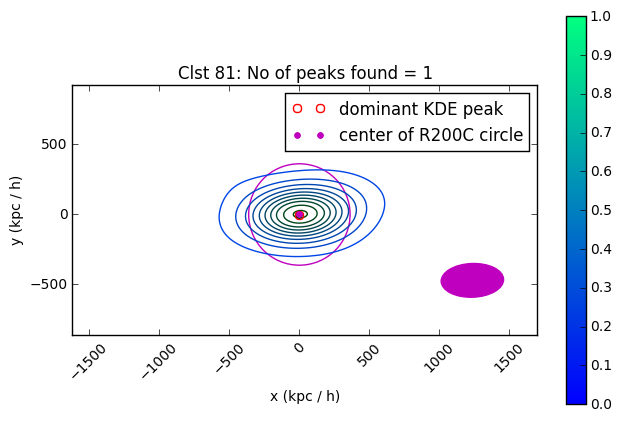

width: 490.840506967, height: 277.263347657, angle -38.8690817684


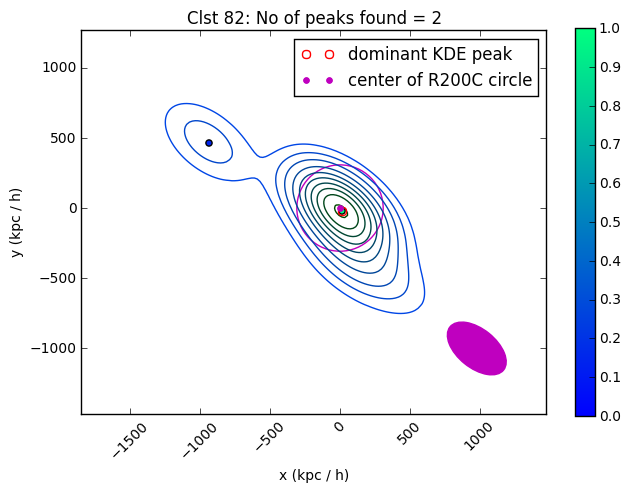

width: 498.282431978, height: 261.406823327, angle -61.1046756671


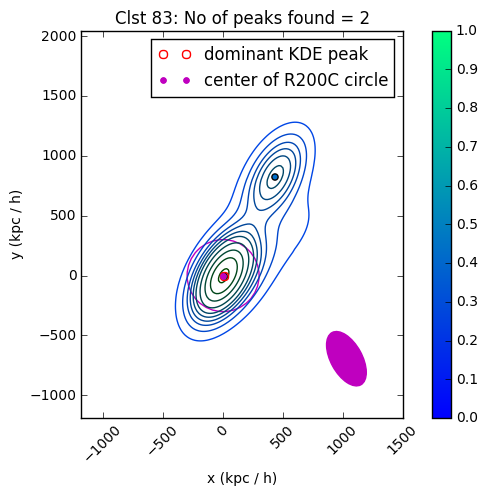

width: 470.553415044, height: 239.798482592, angle -49.5978977288


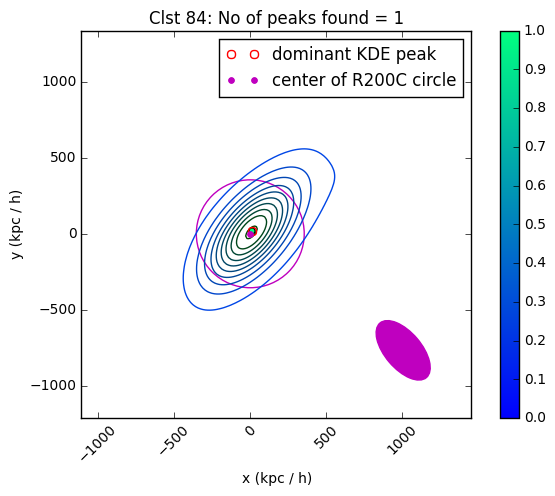

width: 427.218801271, height: 203.022630228, angle -82.6780084939


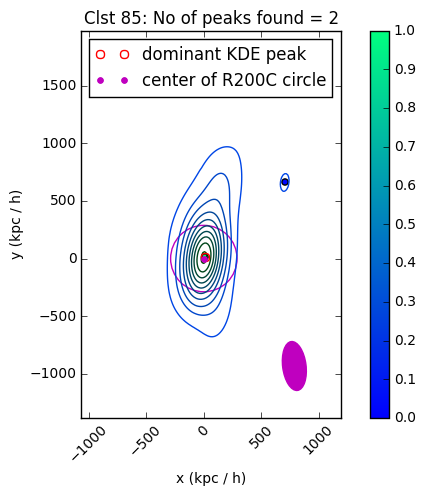

width: 477.810884701, height: 339.819209118, angle -41.6207061803


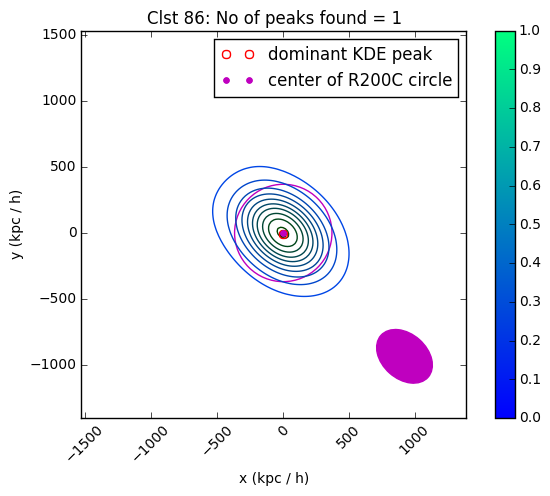

width: 380.861738228, height: 294.876666153, angle -90.3433830583


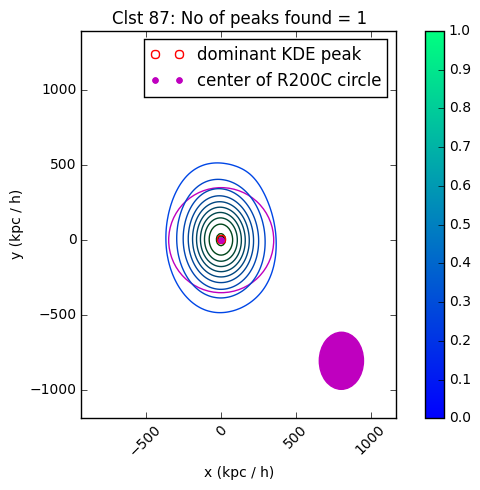

width: 377.384024266, height: 278.710472415, angle -31.0793312177


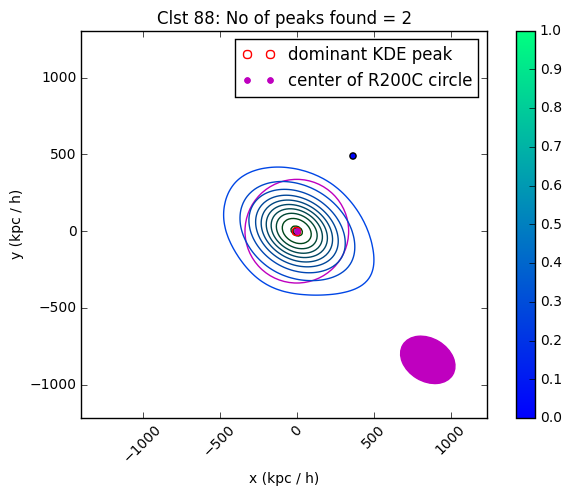

width: 378.595289245, height: 208.895520648, angle -19.0061397648


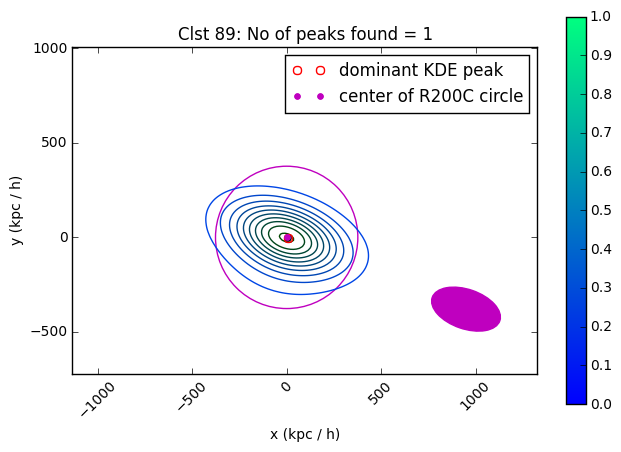

width: 455.695911225, height: 303.203448922, angle -40.7550836183


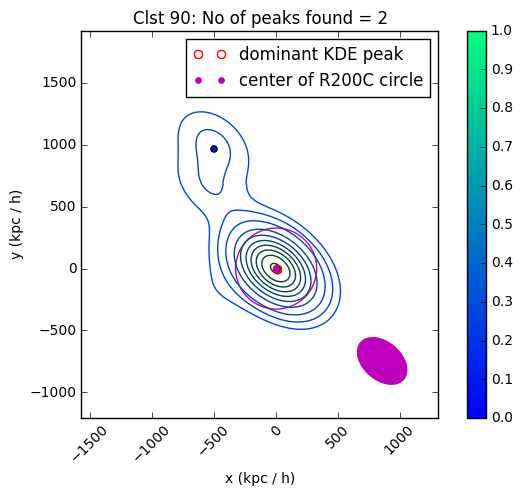

width: 497.289150166, height: 260.071461325, angle 42.9691704957


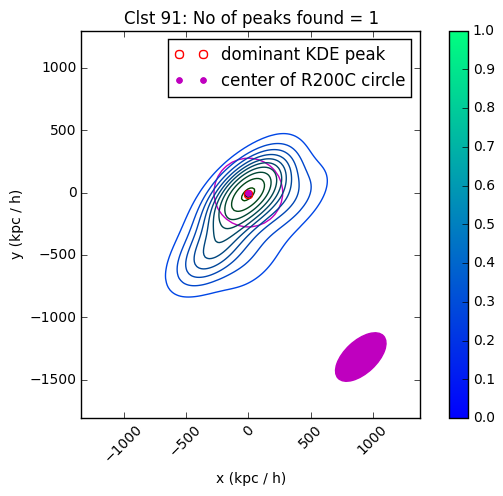

width: 381.658005505, height: 242.107917566, angle 9.57678832612


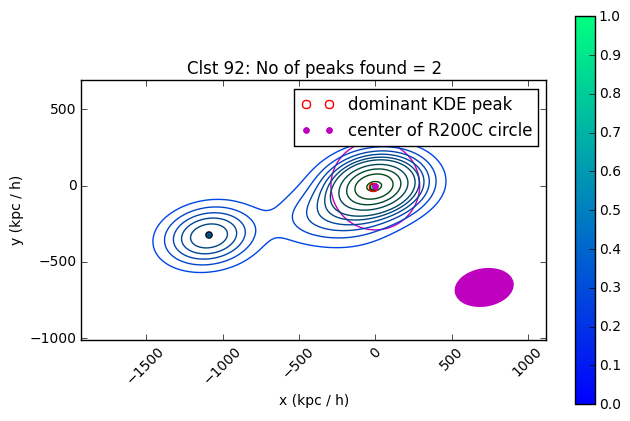

width: 379.108176804, height: 204.046200654, angle 26.9023408271


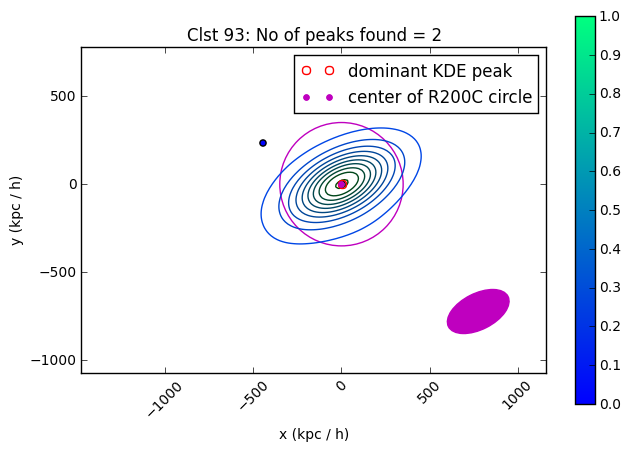

width: 304.735690555, height: 205.798729066, angle 25.8606011477


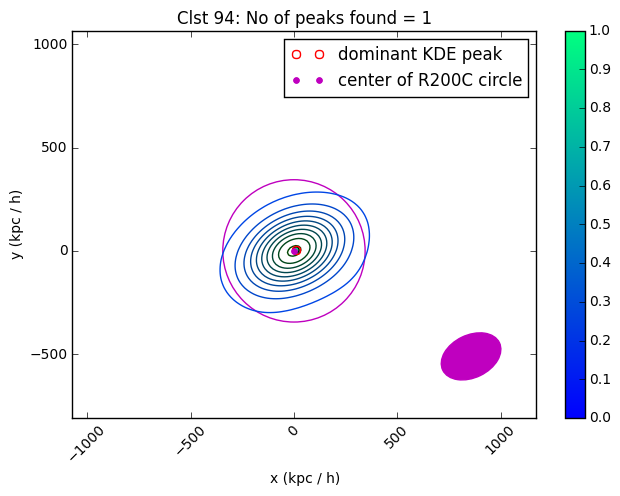

width: 401.807148973, height: 265.634550585, angle -47.3600622649


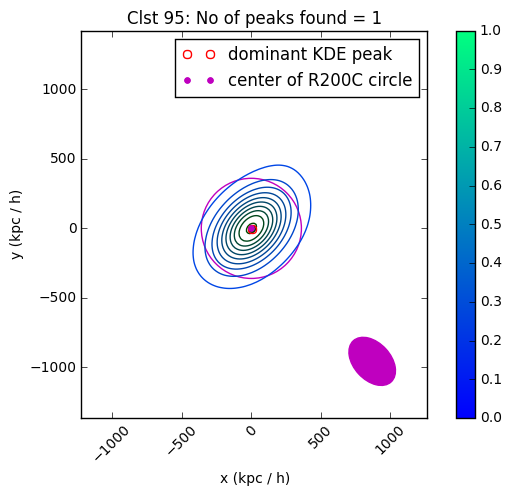

width: 391.2085023, height: 327.851815933, angle -48.9216009075


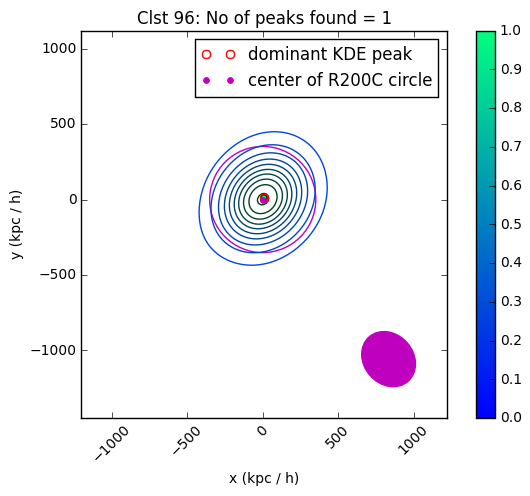

width: 409.987760266, height: 384.617272663, angle -87.9575461598


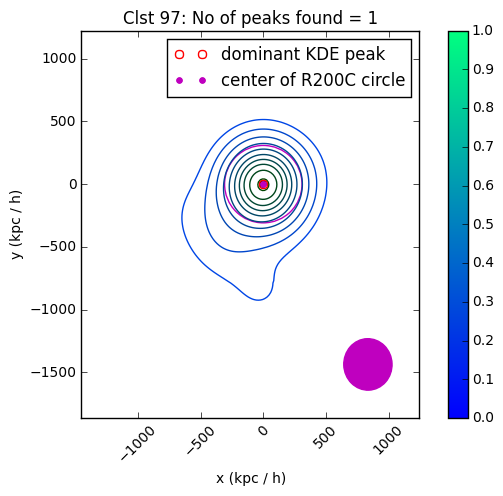

width: 373.070810487, height: 187.972868906, angle -5.33577452556


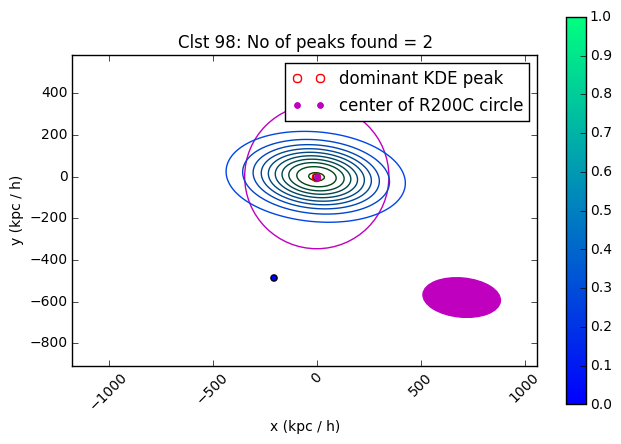

width: 402.759909261, height: 267.426228258, angle -102.790301296


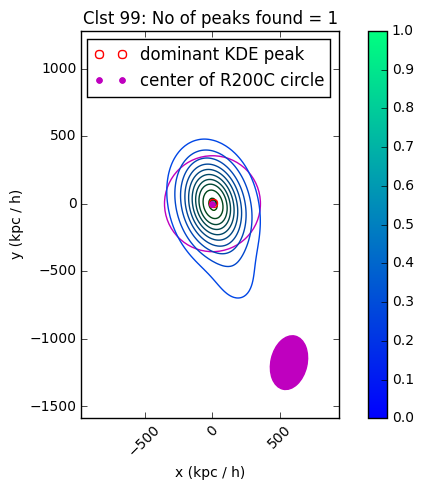

width: 433.312574211, height: 222.562459154, angle 34.8219570028


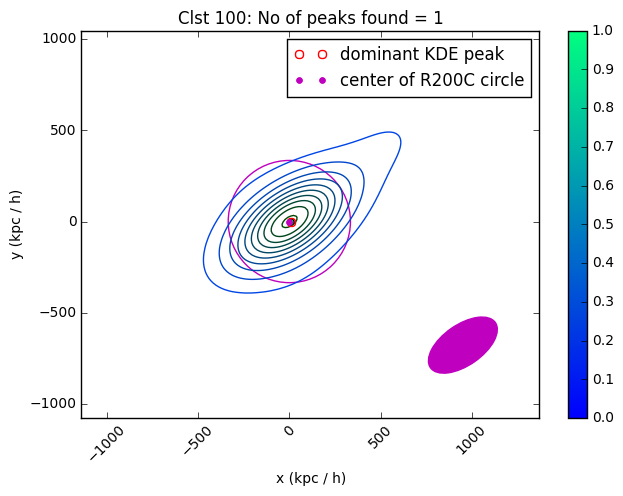

width: 369.802579748, height: 306.087087757, angle -121.47482729


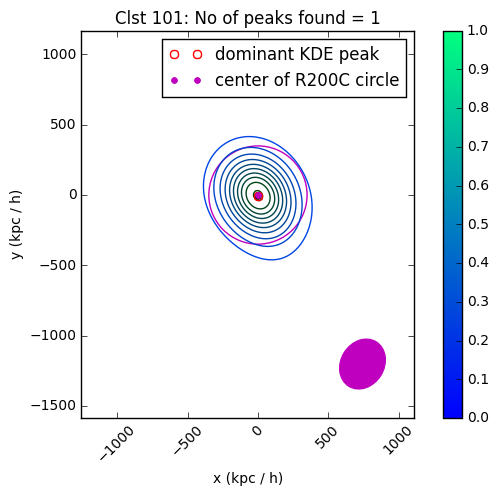

width: 327.397363582, height: 273.971973002, angle -97.8919925512


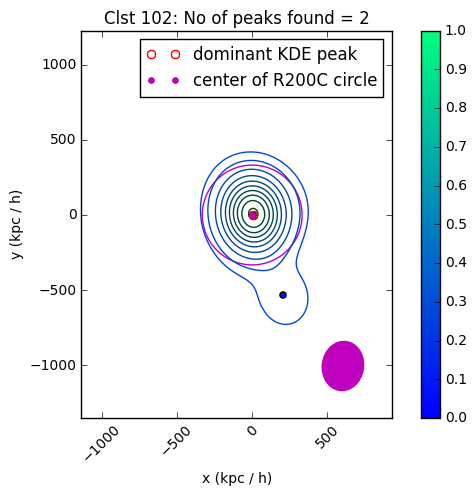

width: 425.246622824, height: 368.400833136, angle 8.4837730866


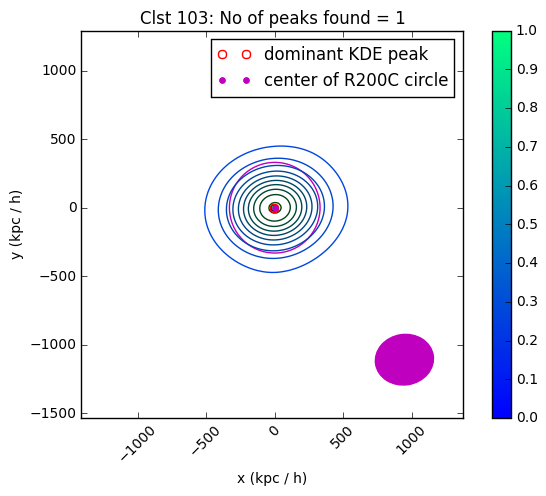

width: 474.89654483, height: 279.592148934, angle -97.4139903095


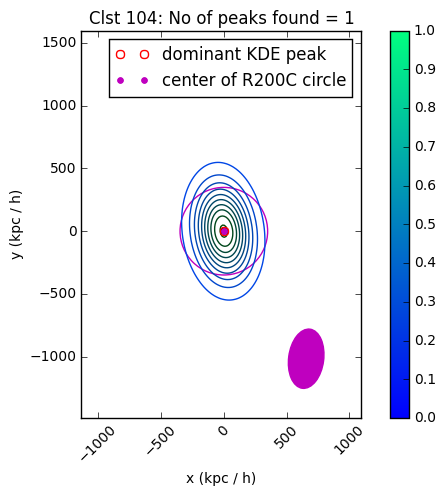

width: 441.684424999, height: 296.576004671, angle -88.834344162


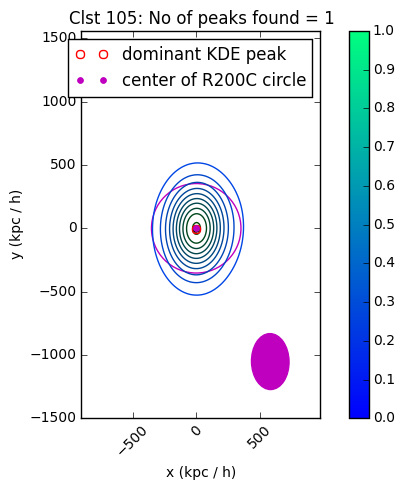

width: 336.762584233, height: 220.655569192, angle -80.8309853521


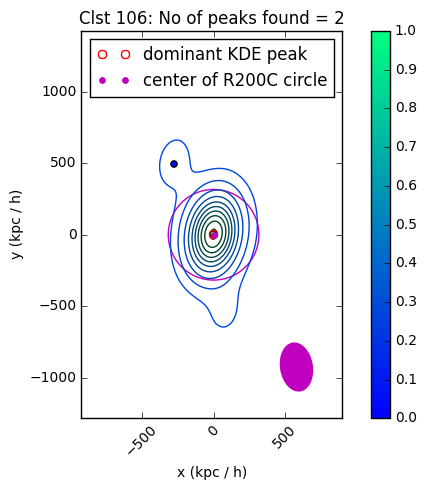

width: 421.993680862, height: 219.624077888, angle -94.07832663


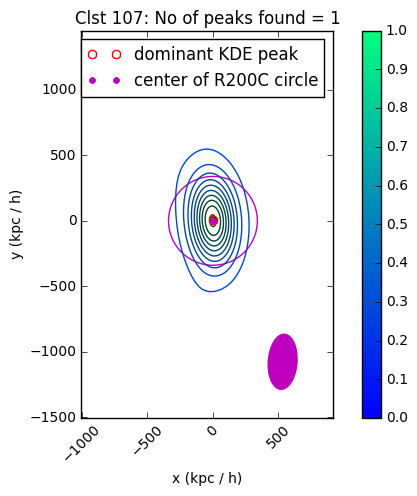

width: 346.615202176, height: 204.88521336, angle -125.837060779


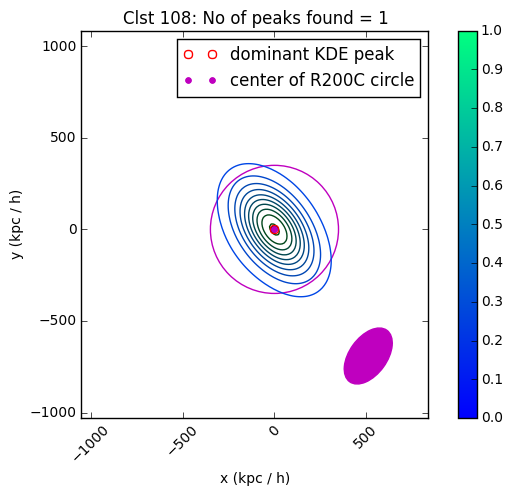

width: 393.550275116, height: 198.258719043, angle -112.159602626


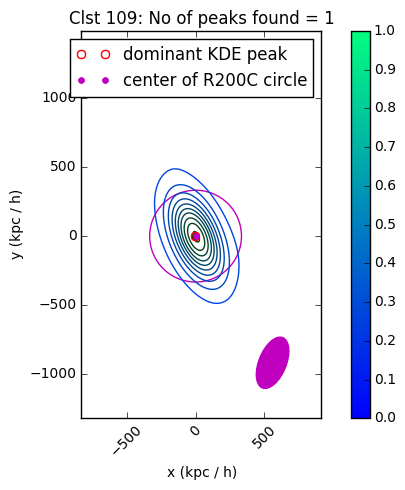

width: 332.360844223, height: 282.249127877, angle 44.0656880077


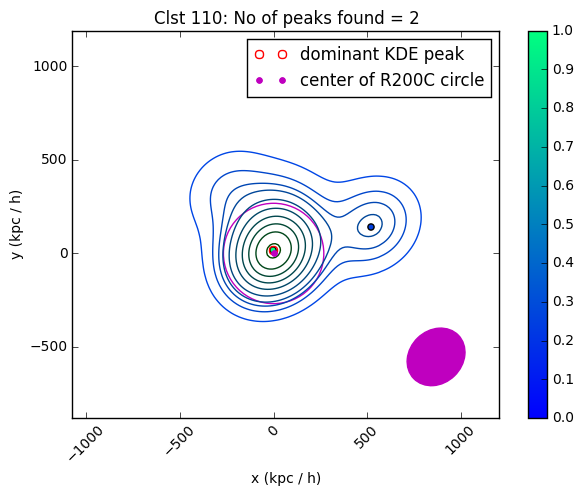

width: 329.773205842, height: 256.22873948, angle 37.036121188


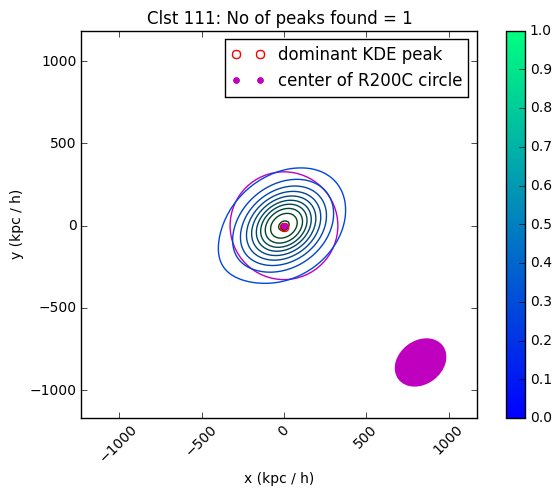

width: 434.790494813, height: 233.738890106, angle -14.4821487294


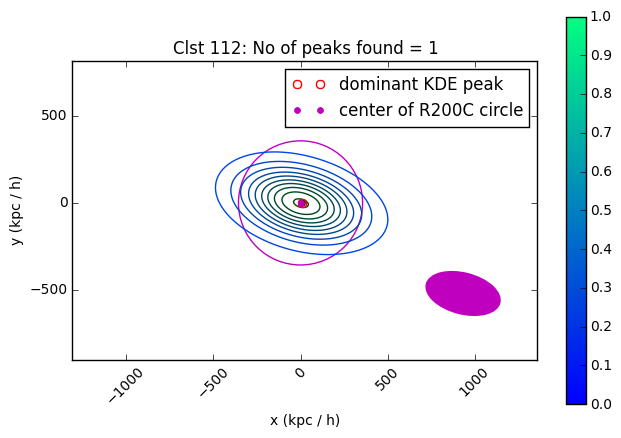

width: 498.305452482, height: 355.085316405, angle -122.500200515


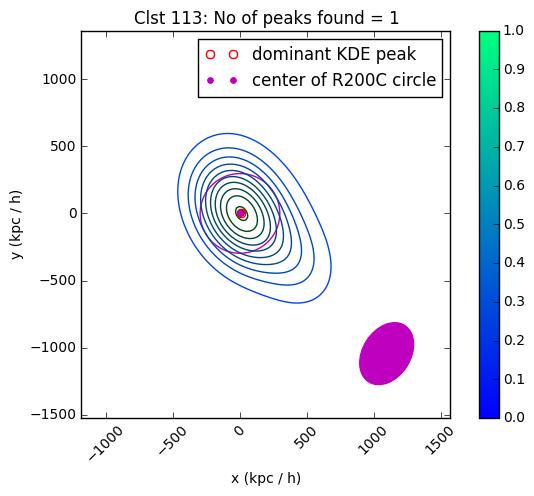

width: 448.950628746, height: 258.906532674, angle -95.5043931982


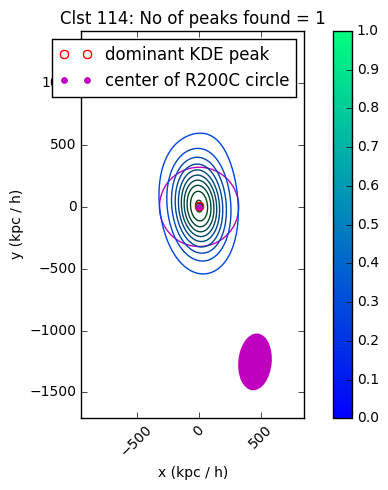

width: 355.193740197, height: 203.180768793, angle -116.089189828


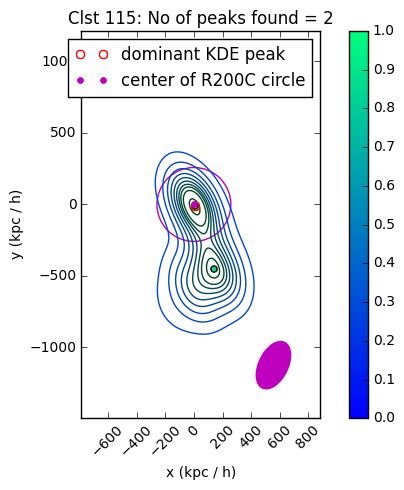

width: 379.639814709, height: 152.998491745, angle -61.5798113746


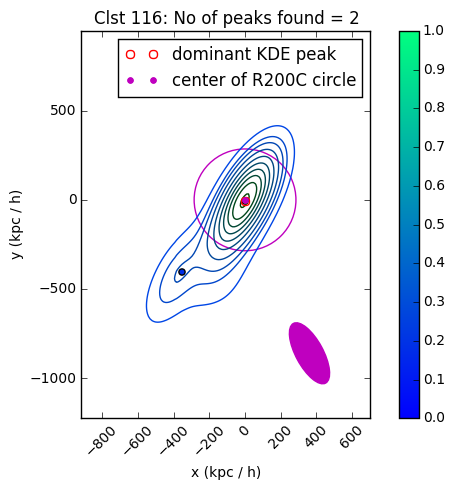

width: 410.443453498, height: 156.826926929, angle 37.20039756


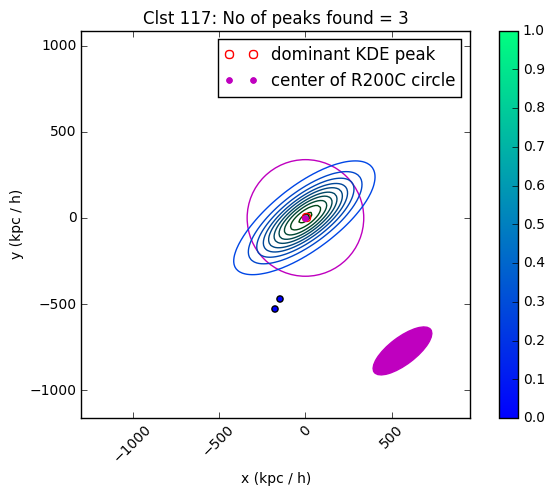

width: 295.508109031, height: 211.330880297, angle -71.7290628691


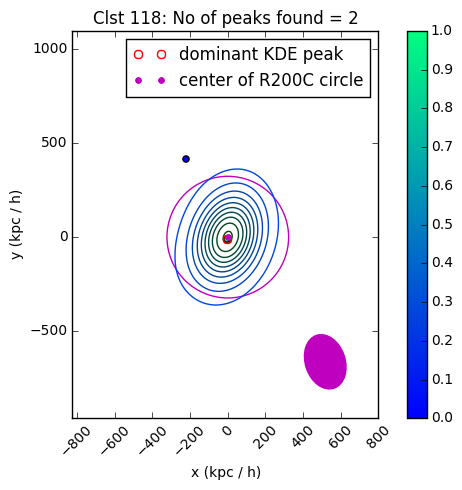

width: 369.914401565, height: 253.189331828, angle 29.3713810597


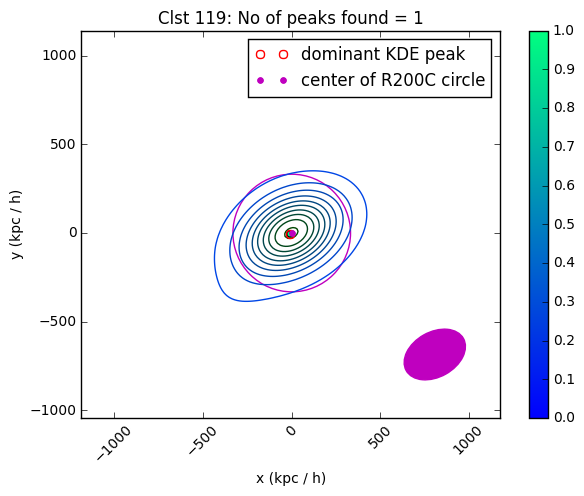

width: 446.223401359, height: 302.019254884, angle -101.310373457


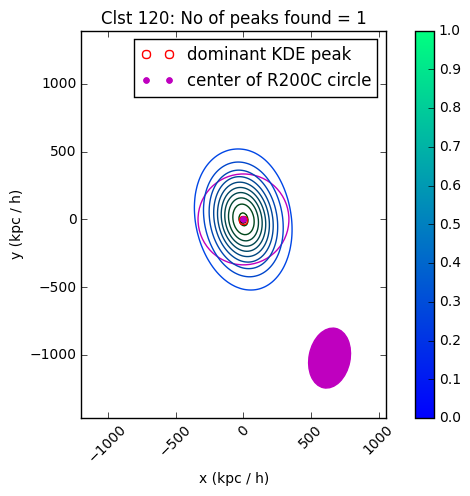

width: 426.649097418, height: 289.118488162, angle 18.6307457314


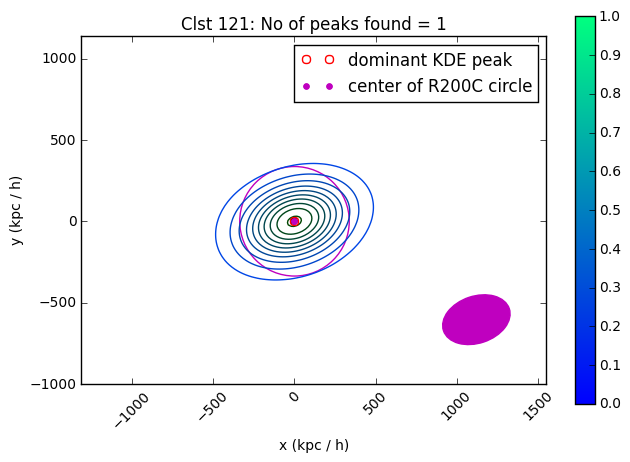

width: 329.850583447, height: 181.927330944, angle -61.3300448539


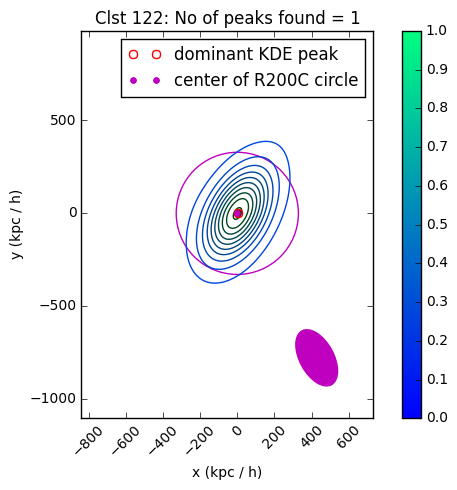

width: 329.801530003, height: 251.960530848, angle -23.2178476553


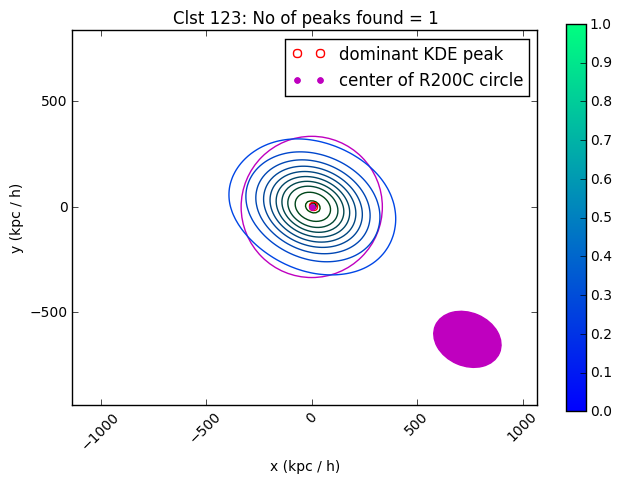

width: 440.897387379, height: 257.566390163, angle -30.1147676464


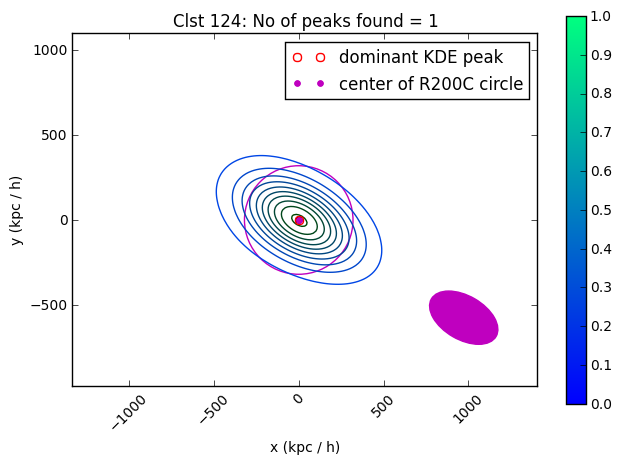

width: 241.952970404, height: 167.500795605, angle 41.7470742205


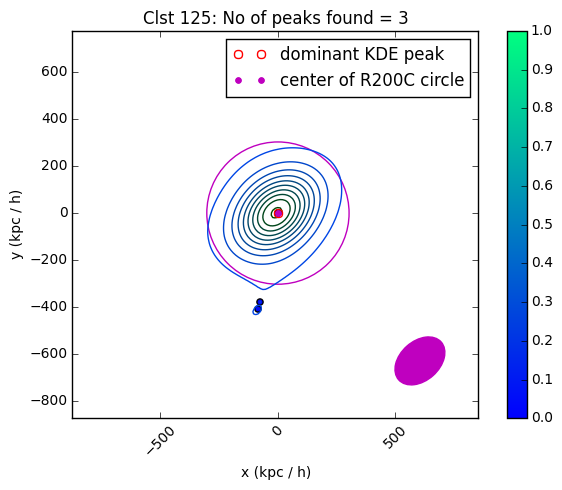

width: 357.737526579, height: 217.704549413, angle -50.404852874


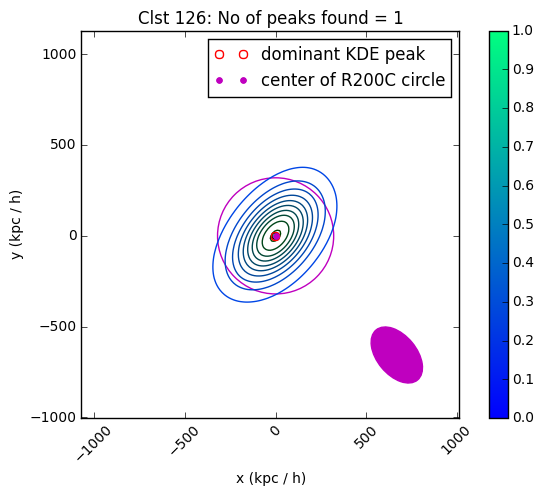

width: 616.310203206, height: 270.163913313, angle 15.8730037494


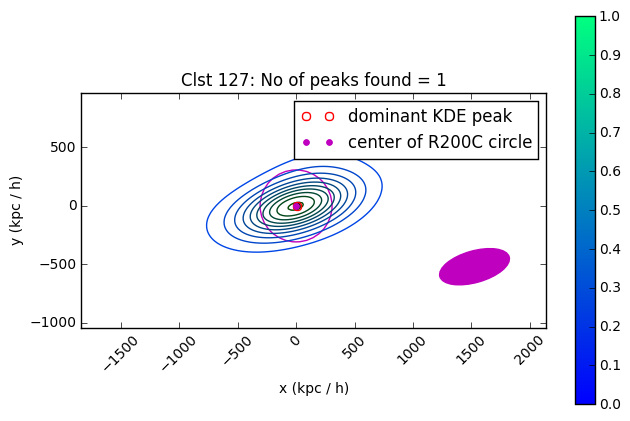

width: 718.825957999, height: 259.804956658, angle -30.9584906953


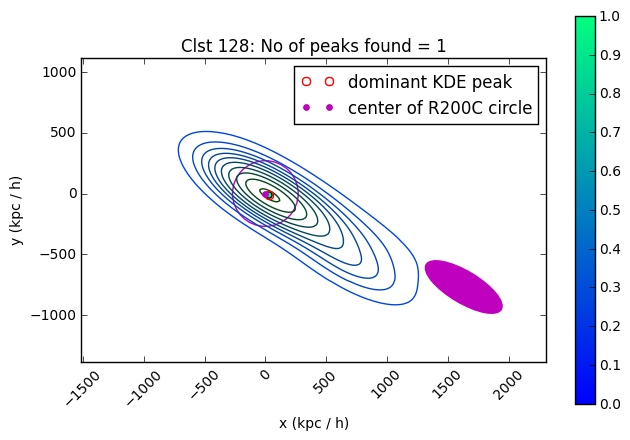

In [50]:
for i in range(129):    
    pg.plot_KDE_peaks(fhat_dict[i], allPeaks=True, 
                      R200C=R200C[i], showData=True,
                      clstNo=i)
    plt.close()

## Examine super outlier i.e. offset > 2 * R200C

In [42]:
super_outlier_mask = offset_list[:, 1] > 2.0

In [43]:
peak_no_list = [len(fhat["peaks_dens"]) for fhat in fhat_list]

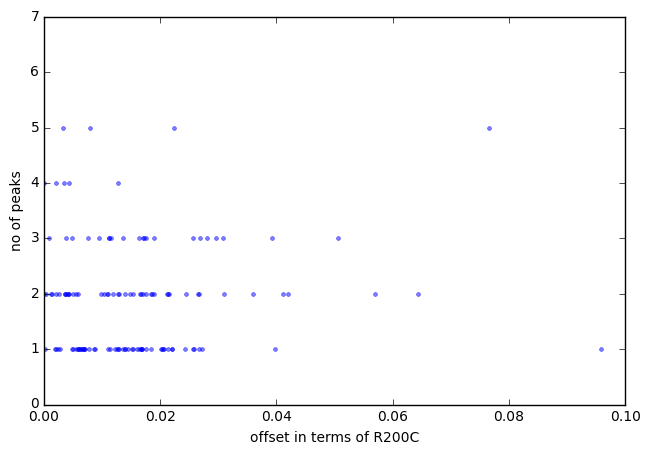

In [44]:
plt.plot(offset_list[:, 1], peak_no_list, ".", alpha=0.5)
plt.ylim((0, 7))
plt.xlabel('offset in terms of R200C')
plt.ylabel('no of peaks')
plt.savefig("../plots/peakNoVsoffsetR200C_no_weights.png",
            bbox_inches='tight')


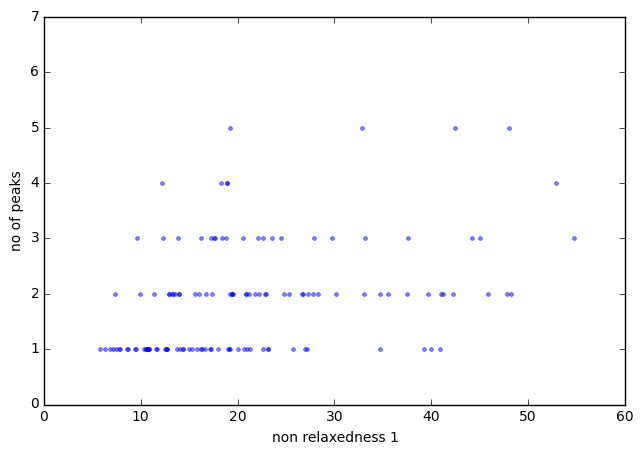

In [45]:
plt.plot(relaxedness_list, peak_no_list, ".", alpha=0.5)
plt.ylim((0, 7))
plt.xlabel('non relaxedness 1')
plt.ylabel('no of peaks')
plt.savefig("../plots/peakNoVsRelaxedness_no_weights.png",
            bbox_inches='tight')

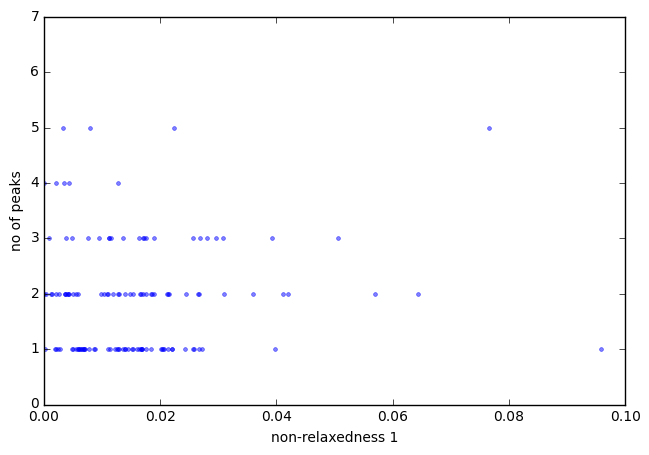

In [46]:
plt.plot(offset_list[:, 1], peak_no_list, ".", alpha=0.5)
plt.ylim((0, 7))
plt.xlabel('non-relaxedness 1')
plt.ylabel('no of peaks')

In [47]:
outlier_mask = np.logical_and(offset_list[:, 1] > 0.5, 
                              offset_list[:, 1] < 2.0)

In [48]:
fhat_dict[0].keys()

['gridtype',
 'bandwidth_matrix_H',
 'peaks_ycoords',
 'peaks_xcoords',
 'gridded',
 'weight_w',
 'binned',
 'peaks_colIx',
 'names',
 'estimate',
 'data_x',
 'eval_points',
 'peaks_rowIx',
 'peaks_dens']